In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.transforms as mtransforms
from sklearn.model_selection import train_test_split
from joblib import dump, load
import tensorflow as tf
import seaborn as sns
import math

import header as h

import sys
import numpy as np
import matplotlib.pyplot as plt
import h5py
from matplotlib import gridspec
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator, FixedLocator
from matplotlib.backends.backend_pdf import PdfPages
from scipy import optimize
plt.style.use('mystyle.mplstyle')
# plt.style.use("danielballan.mplstyle")

colors = [u'#1f77b4', u'#ff7f0e', u'#2ca02c', u'#d62728', u'#9467bd', u'#8c564b', u'#e377c2', u'#7f7f7f',
          u'#bcbd22', u'#17becf']

solar_like_path = '../data/solar-like.csv'
LAMOST_Gaia_APOGEE_path = '../data/dataset/LGA/LAMOST_Gaia_APOGEE.csv'
LAMOST_Gaia_APOGEE_parampath = '../data/dataset/LGA/LAMOST_Gaia_APOGEE_param.csv'
LAMOST_Gaia_path = '../data/dataset/LG/LAMOST_Gaia.csv'
LAMOST_Gaia_parampath = '../data/dataset/LG/LAMOST_Gaia_param.csv'

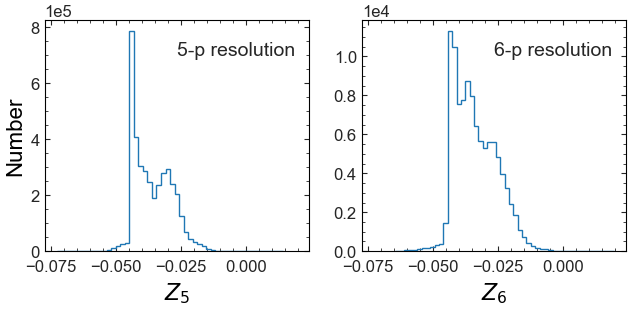

In [8]:
# 分析零点校正数值
def draw_zeropoint(data):
    zp_index = set(data.index) - set(np.where(np.isnan(data['plx_zeropoint']))[0])
    fivep_index = list(zp_index & set(np.where(data['astrometric_params_solved']==31)[0]))
    sixp_index = list(zp_index & set(np.where(data['astrometric_params_solved']==95)[0]))
    
    fig, ax = plt.subplots(1,2,figsize = (7.5,3),sharex=True)

    ax[0].hist(data.loc[fivep_index,'plx_zeropoint'],label='5-p resolution',bins=50,histtype='step')
    ax[1].hist(data.loc[sixp_index,'plx_zeropoint'],label='6-p resolution',bins=50,histtype='step')
    ax[0].set_xlabel('$Z_{5}$')
    ax[1].set_xlabel('$Z_{6}$')
    ax[0].set_ylabel('Number')
    # ax[0].legend()
    # ax[1].legend()
    ax[0].text(0.5, 0.85, s='5-p resolution', transform = ax[0].transAxes)
    ax[1].text(0.5, 0.85, s='6-p resolution', transform = ax[1].transAxes)
    ax[0].ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax[1].ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    #fig.tight_layout()
    plt.savefig('../figure/zeropoint_hist.pdf')
    
solar_like = pd.read_csv(solar_like_path)
draw_zeropoint(solar_like)

total: 4067525
WITHOUT gaia source: 44668
WITH gaia source: 4022857
check numbers total: 4022857 4022857 4022857 4022857 4022857
check numbers group1: 3695845
check numbers group2: 3343463
check numbers group3: 2822422


/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be

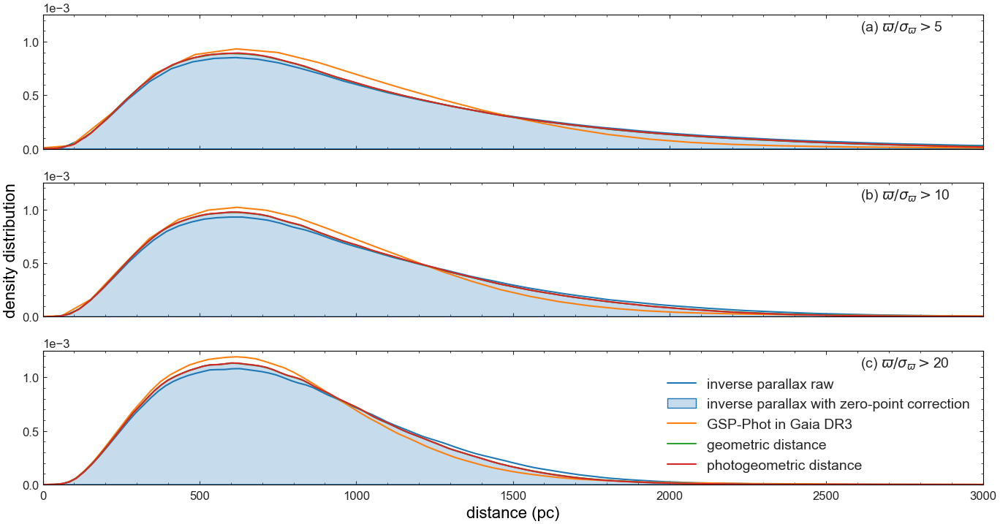

In [9]:
solar_like_withgaia = h.getData_ingaia(solar_like)
file = solar_like_withgaia
# 核密度图
# inverse parallax raw
# inverse parallax with zero-point correction
# GSP-Phot in Gaia DR3
# Bailer-Jones geo
# Bailer-Jones photogeo
import seaborn as sns

# 同样为了更为严格的条件，选用未经校正的parallax_over_error
# poe_c = file['plx_correction_oe']
poe = file['parallax_over_error']

low = 5 
mid = 10
high = 20

inv_plx_r = 1000 / file['parallax']
inv_plx_c = 1000 / file['plx_correction']
dis_gsp = file['distance_gspphot']
dis_geo = file['r_med_geo']
dis_photogeo = file['r_med_photogeo']

group1 = poe > low
group2 = poe > mid
group3 = poe > high

print('check numbers total:',len(inv_plx_r),len(inv_plx_c),len(dis_gsp),len(dis_geo),len(dis_photogeo))
print('check numbers group1:',len(inv_plx_r[group1]))
print('check numbers group2:',len(inv_plx_r[group2]))
print('check numbers group3:',len(inv_plx_r[group3]))

fig,ax = plt.subplots(3,1,figsize=(14,7.5),sharex=True,sharey=True)

label = ['inverse parallax raw','inverse parallax with zero-point correction',
         'GSP-Phot in Gaia DR3','geometric distance','photogeometric distance']
text = ['(a) $\\varpi / \\sigma_{\\varpi} > $'+str(low),
        '(b) $\\varpi / \\sigma_{\\varpi} > $'+str(mid),
        '(c) $\\varpi / \\sigma_{\\varpi} > $'+str(high)]

for i in range(3):
    if i == 0:
        group = group1
    elif i == 1:
        group = group2
    elif i == 2:
        group = group3
    sns.kdeplot(inv_plx_r[group],ax=ax[i],label=label[0])
    sns.kdeplot(inv_plx_c[group],ax=ax[i],label=label[1],fill=True)
    sns.kdeplot(dis_gsp[group],ax=ax[i],label=label[2])
    sns.kdeplot(dis_geo[group],ax=ax[i],label=label[3])
    sns.kdeplot(dis_photogeo[group],ax=ax[i],label=label[4])
    ax[i].text(0.87,0.88,text[i],transform=ax[i].transAxes)
    ax[i].set_xlim((0,3000))
    ax[i].ticklabel_format(style='sci', axis='y', scilimits=(0, 0))

ax[0].set_ylabel('')
ax[1].set_ylabel('density distribution')
ax[2].set_ylabel('')

ax[2].legend(loc = 'lower right')
ax[2].set_xlabel('distance (pc)')
fig.tight_layout()

plt.savefig('../figure/distance_pdf.pdf')

In [10]:
# draw_distanceResid 中需要用到的函数，调整colorbar位置和大小
def add_right_cax(ax, pad, width):
    '''
    在一个ax右边追加与之等高的cax.
    pad是cax与ax的间距,width是cax的宽度.
    '''
    axpos = ax.get_position()
    caxpos = mtransforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

# 画出不同来源的距离对比图 & 残差图
def draw_distanceResid(file,ydata,xdata,poe_limit=5, sigma=1, ylim = (-10,15)):
    vmin = 5
    vmax = 20 
    cond_poe = np.where(file['parallax_over_error']>poe_limit)[0]
    
    if ydata == 'distance_gspphot':
        ylabel1 = '$d_{gspphot}$ (pc)'
    elif ydata == 'r_med_geo':
        ylabel1 = '$d_{geo}$ (pc)'
    elif ydata == 'r_med_photogeo':
        ylabel1 = '$d_{photogeo}$ (pc)'
    if xdata == 'plx_correction':
        xlabel = '1000/$(\\varpi)_{0}$ (pc)'
        x = 1000 / file.loc[cond_poe,xdata]
    elif xdata == 'r_med_geo':
        xlabel = '$d_{geo}$ (pc)'
        x = file.loc[cond_poe,xdata]

    ylabel2 = 'residuals'
    
    y = file.loc[cond_poe,ydata]
    z = file.loc[cond_poe,'parallax_over_error']
    std = np.std(y-x)
    resid = (y-x) / std

    fig = plt.figure(figsize=(7.5,10))
    gs = GridSpec(3, 2, figure=fig) 

    # 在第一个子图中画图
    ax1 = fig.add_subplot(gs[0:2,:])
    hb = ax1.hexbin(x,y,gridsize=500, bins='log',xscale='log',yscale='log', mincnt=1) #, cmap='PuBuGn'
    # 设置的colorbar
    cax1 = add_right_cax(ax1, pad=0.02, width=0.02)
    cb1 = fig.colorbar(hb, cax=cax1)
    cb1.ax.set_title('$log_{10}(N)$')
    ax1.plot([0,1],[0,1],transform=ax1.transAxes, ls='--',c='r')
    ax1.set_ylabel(ylabel1)
    ax1.set_title('$\\varpi / \\sigma_{\\varpi} > %d$'%poe_limit,loc='left')
    ax1.set_xscale('log')
    ax1.set_yscale('log')

    # 在第二个子图中画图
    ax2 = fig.add_subplot(gs[2, :])
    #ax2.scatter(x,resid,s=1,alpha=0.2,color='k')
    sc = ax2.scatter(x,resid,c=z,s=1, alpha=0.8,vmin=vmin,vmax=vmax) #, cmap='RdPu'
    # 设置的colorbar
    cax2 = add_right_cax(ax2, pad=0.02, width=0.02)
    cb2 = fig.colorbar(sc,cax=cax2)
    cb2.ax.set_title('$\\frac{\\varpi}{\\sigma_{\\varpi}}$')
    
    ax2.axhline(sigma,ls=":",c='k',label = '$%d\\sigma = $ %.2f pc' %(sigma,(sigma*std)))
    ax2.axhline(-sigma,ls=":",c='k')
    
    ax2.set_ylim(ylim)
    ax2.legend(loc='upper right')
    ax2.set_xlabel(xlabel)
    ax2.set_ylabel(ylabel2)
    fig.show()

    print('parallax over error > %d :'%poe_limit,len(cond_poe))
    print('within one sigma > 5:',len(np.where(np.abs(resid)<=1)[0]))

    plt.savefig('../figure/distance_mixplot.pdf')

/var/folders/pc/px2hh_yx5kx7bc_h03thddh00000gn/T/ipykernel_49962/3586742866.py:75: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


parallax over error > 5 : 3695845
within one sigma > 5: 2930202


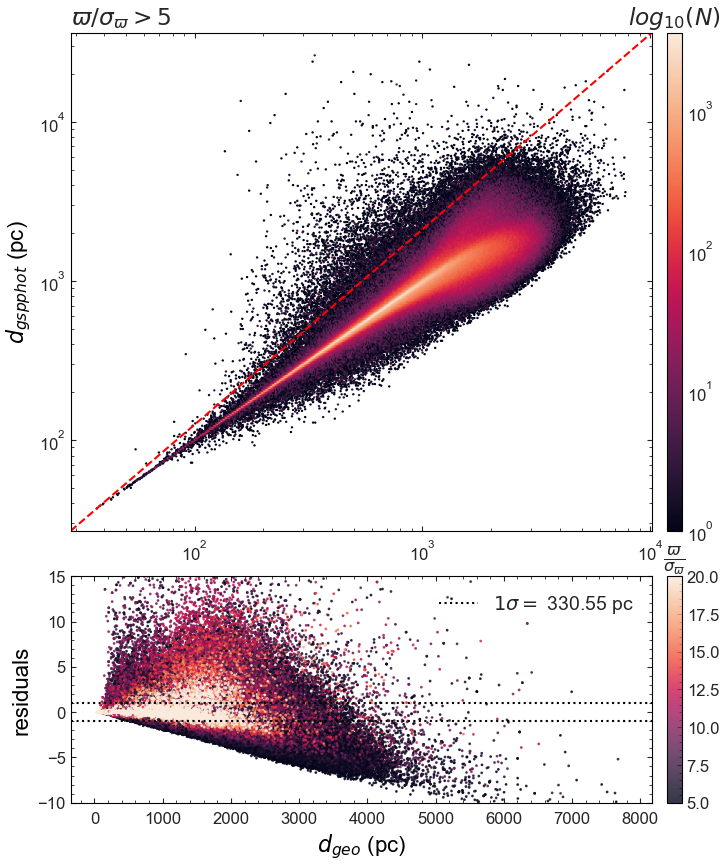

In [11]:
file = solar_like_withgaia
draw_distanceResid(file,ydata = 'distance_gspphot',xdata='r_med_geo',poe_limit=5)

In [40]:
# draw_distanceResid 中需要用到的函数，调整colorbar位置和大小
def add_right_cax(ax, pad, width):
    '''
    在一个ax右边追加与之等高的cax.
    pad是cax与ax的间距,width是cax的宽度.
    '''
    axpos = ax.get_position()
    caxpos = mtransforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

def draw_LAMOST_APOGEE(data,figpath):
    x_label = ['$T_{eff}$'+' $_{APOGEE}$','log'+'$g _{APOGEE}$','[Fe/H]'+' $_{APOGEE}$']
    y_label = ['$T_{eff}$'+' $_{LAMOST}$','log'+'$g _{LAMOST}$','[Fe/H]'+' $_{LAMOST}$']
    teff_lim=(4700,6850)
    logg_lim=(3.6,5.)
    feh_lim=(-1.1,0.65)
    teff_resid = data['teff_2']-data['TEFF_1']
    logg_resid = data['logg_2']-data['LOGG_1']
    feh_resid = data['feh']-data['FE_H']
    teff_sigma = np.std(teff_resid)
    logg_sigma = np.std(logg_resid)
    feh_sigma = np.std(feh_resid)

    fig = plt.figure(figsize=(12,4),dpi=200)
    gs = GridSpec(3, 3, figure=fig, wspace=0.5, hspace=0.1) 

    # 在第一个子图中画图
    ax1 = fig.add_subplot(gs[0:2,0])
    hb1 = ax1.hexbin(data['TEFF_1'],data['teff_2'],gridsize=100,mincnt=1)
    # 设置的colorbar
    cax1 = add_right_cax(ax1, pad=0.005, width=0.005)
    cb1 = fig.colorbar(hb1, cax=cax1)
    # cb1.ax.set_title('Count')
    ax1.plot([0,1],[0,1],transform=ax1.transAxes, ls='--',c='r')
    ax1.set_ylabel(y_label[0])
    ax1.set_xlim(teff_lim)
    ax1.set_ylim(teff_lim)
    ax1.xaxis.set_ticklabels([])

    # 在第二个子图中画图
    ax2 = fig.add_subplot(gs[0:2,1])
    hb2 = ax2.hexbin(data['LOGG_1'],data['logg_2'],gridsize=100,mincnt=1)
    # 设置的colorbar
    cax2 = add_right_cax(ax2, pad=0.005, width=0.005)
    cb2 = fig.colorbar(hb2, cax=cax2)
    # cb2.ax.set_title('Count')
    ax2.plot([0,1],[0,1],transform=ax2.transAxes, ls='--',c='r')
    ax2.set_ylabel(y_label[1])
    ax2.set_xlim(logg_lim)
    ax2.set_ylim(logg_lim)
    ax2.xaxis.set_ticklabels([])

    # 在第三个子图中画图
    ax3 = fig.add_subplot(gs[0:2,2])
    hb3 = ax3.hexbin(data['FE_H'],data['feh'],gridsize=100,mincnt=1)
    # 设置的colorbar
    cax3 = add_right_cax(ax3, pad=0.005, width=0.005)
    cb3 = fig.colorbar(hb3, cax=cax3)
    # cb3.ax.set_title('Count')
    ax3.plot([0,1],[0,1],transform=ax3.transAxes, ls='--',c='r')
    ax3.set_ylabel(y_label[2])
    ax3.set_xlim(feh_lim)
    ax3.set_ylim(feh_lim)
    ax3.xaxis.set_ticklabels([])

    ax4 = fig.add_subplot(gs[2,0])
    ax4.scatter(data['TEFF_1'],teff_resid,s=1,alpha=0.2,color='k')
    ax4.axhline(teff_sigma,ls=":",c='r',label = '$\sigma = %.2f $'%(teff_sigma))
    ax4.axhline(-teff_sigma,ls=":",c='r')
    # ax4.legend(loc='upper right')
    #ax4.set_xlim(teff_lim)
    ax4.set_ylabel('residuals')
    ax4.set_xlabel(x_label[0])
    ax4.text(0.5, 0.75, s='$\sigma = %.2f $'%(teff_sigma), transform=ax4.transAxes)

    ax5 = fig.add_subplot(gs[2,1])
    ax5.scatter(data['LOGG_1'],logg_resid,s=1,alpha=0.2,color='k')
    ax5.axhline(logg_sigma,ls=":",c='r',label = '$\sigma = %.2f$'%(logg_sigma))
    ax5.axhline(-logg_sigma,ls=":",c='r')
    # ax5.legend(loc='upper right')
    ax5.set_xlabel(x_label[1])
    #ax5.set_xlim(logg_lim)
    ax5.text(0.6, 0.75, s='$\sigma = %.2f$'%(logg_sigma), transform=ax5.transAxes)

    ax6 = fig.add_subplot(gs[2,2])
    ax6.scatter(data['FE_H'],feh_resid,s=1,alpha=0.2,color='k')
    ax6.axhline(feh_sigma,ls=":",c='r',label = '$\sigma = %.2f$'%(feh_sigma))
    ax6.axhline(-feh_sigma,ls=":",c='r')
    # ax6.legend(loc='upper right')
    ax6.set_xlabel(x_label[2])
    #ax6.set_xlim(feh_lim)
    ax6.text(0.6, 0.75, s='$\sigma = %.2f$'%(feh_sigma), transform=ax6.transAxes)
    

    plt.savefig(figpath)

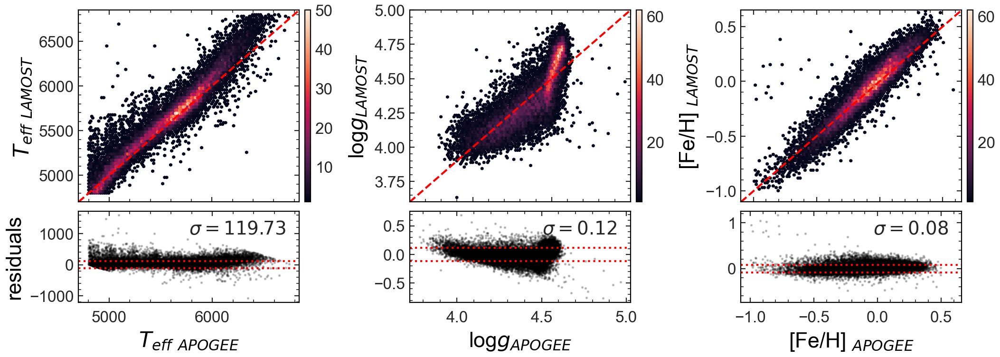

In [41]:
lamost_gaia_apogee = pd.read_csv(LAMOST_Gaia_APOGEE_path)
draw_LAMOST_APOGEE(lamost_gaia_apogee,'../figure/LAMOST_APOGEE_compare.pdf')

origin number: 4067525
fibermask == 0: 2727344
total sample: 2727344
low snr quality in: 1877704
high snr quality in : 834157
total: 834157
WITHOUT gaia source: 8258
WITH gaia source: 825899
no distance from GSP-Phot in sample: 83160
no distance from Bailer-Jones in sample: 8793
no parallax(WITHOUT zeropoint correction) in sample (including nan and negative): 11638
no distance from GSP-Phot and Bailer-Jones and parallax: 84434 

low parallax quality in sample (parallax_over_error <=  20 ): 91319
bad distance or parallax in total: 164639


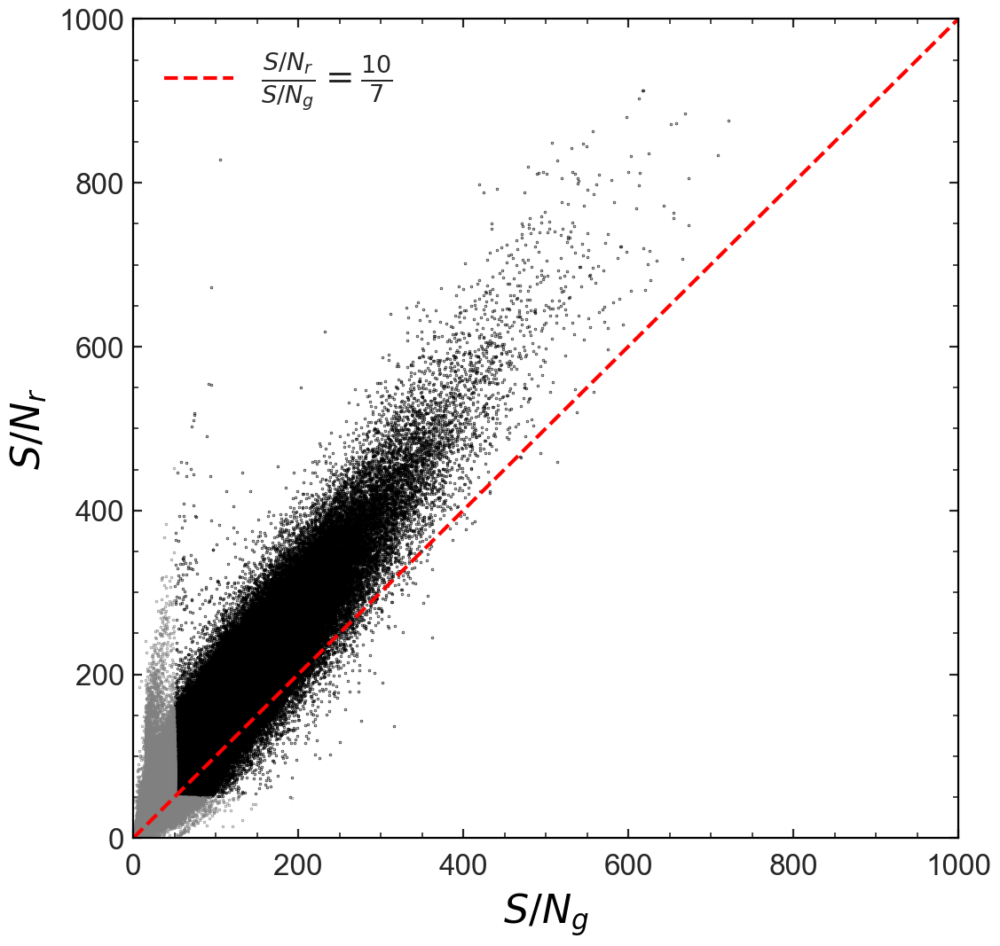

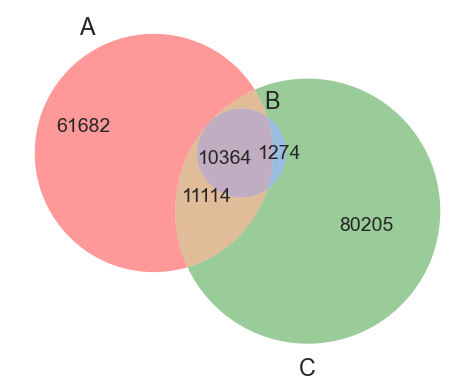

total dataset: 825899
with resonable distance and parallax: 661260
if there is no bp_rp_0: (array([], dtype=int64),)
if there is no mg_geo: (array([], dtype=int64),)


In [2]:
from importlib import reload
reload(h)

solar_like = pd.read_csv('../data/solar-like_forcut.csv')
# LAMOST cuts
solar_like_fiber = h.select_fibermask(solar_like)
solar_like_snr = h.select_SNR(solar_like_fiber,snrg_limit=50,snrr=False,snrr_limit=50)

# Gaia cuts
solar_like_withgaia = h.getData_ingaia(solar_like_snr)
solar_like_withdis = h.resonable_dis_plx(solar_like_withgaia,l_p_limit = 20)

# 查看 bp_rp_0 与 mg_geo 是否完备
solar_like_withdis_comp = h.check_color_mag_completeness(solar_like_withdis)
#  bp_rp_0 与 mg_geo 完备的条件下，随机抽样 60000 条
rand_sample = h.random_sample(data_dup=solar_like_withdis_comp, number=60000)

in both absolute magnitude and bp_rp range: 59632


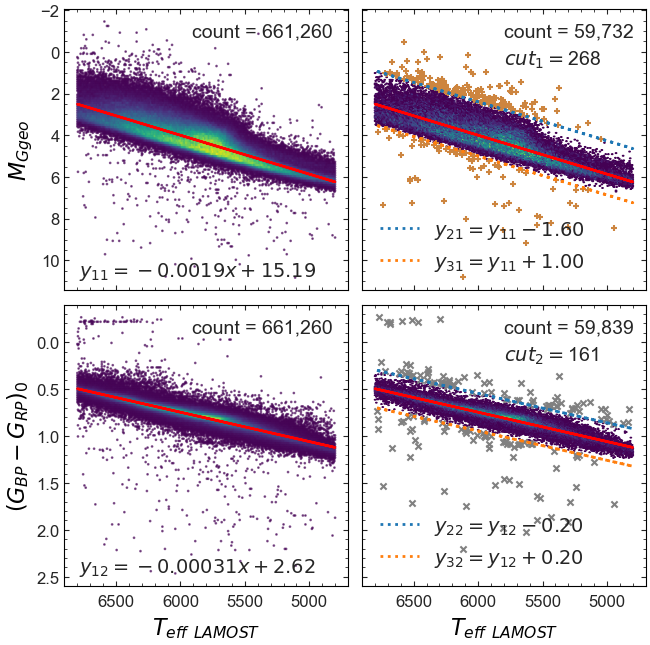

In [17]:
def cut_data(data1,data2,low1=1.6,up1=1,low2=0.2,up2=0.2):
    '''
    在随机选取60000个样本后，通过限制绝对星等和颜色的范围，来限制参数的范围
    去除超出经验外的部分
    low1、up1 和 low1、up2 分别为绝对星等和颜色的拟合线的上限和下限

    return: 返回cut后的数据集
    '''
    datax = data1['teff_2']
    datamg = data1['mg_geo']
    databprp = data1['bp_rp_0']
    x_data = data2['teff_2'].values.ravel()
    mg_data = data2['mg_geo'].values.ravel()
    bprp_data = data2['bp_rp_0'].values.ravel()

    # 绘制拟合线
    def f_1(x,A,B):
        return A*x + B

    A1,B1 = optimize.curve_fit(f_1,x_data,mg_data)[0]
    A2,B2 = optimize.curve_fit(f_1,x_data,bprp_data)[0]

    y1_data = A1*x_data + B1
    y2_data = A2*x_data + B2


    index1 = np.where((data2['mg_geo'] > A1*data2['teff_2'] + B1 -low1) & (data2['mg_geo'] < A1*data2['teff_2'] + B1 + up1))[0]
    index2 = np.where((data2['bp_rp_0'] > A2*data2['teff_2'] + B2 -low2) & (data2['bp_rp_0'] < A2*data2['teff_2'] + B2 + up2))[0]
    remnant1 = set(data2.index) - set(index1)
    remnant2 = set(data2.index) - set(index2)
    final = set(data2.index) - remnant1 - remnant2
    return_data = data2.loc[list(final),:].reset_index(drop=True)

    fig= plt.figure(figsize=(7.5,7.5))
    gs = GridSpec(2, 2, figure=fig)

    ax = fig.add_subplot(gs[0,0])
    ax.hexbin(datax,datamg,gridsize=200,mincnt=1,alpha=0.6, cmap='viridis')
    ax.plot(x_data,y1_data, color='r',linewidth=1.8,linestyle='-',label='$y_{11}=%.4fx+%.2f$'%(A1,B1))
    # ax.legend(loc='lower right')
    ax.invert_xaxis()
    ax.invert_yaxis()
    ax.text(0.45, 0.9, 'count = '+format(len(data1),','), transform=ax.transAxes)
    ax.text(0.05, 0.05, '$y_{11}=%.4fx+%.2f$'%(A1,B1), transform=ax.transAxes)
    #ax.set_xlabel('$T_{eff}$'+' $_{LAMOST}$')
    ax.set_ylabel('$M_{Ggeo}$')
    ax.tick_params(axis='x', labelbottom=False)
    # ax.xaxis.set_ticklabels([])

    ax2 = fig.add_subplot(gs[0,1])
    ax2.hexbin(data2.loc[list(index1), 'teff_2'],data2.loc[list(index1),'mg_geo'],gridsize=200,mincnt=1, cmap='viridis')
    ax2.plot(x_data,y1_data, color='r',linewidth=1.8,linestyle='-') #,label='$y_{1}=%.4fx+%.2f$'%(A1,B1)
    ax2.plot(x_data,y1_data-low1,linewidth=2,linestyle=':',label='$y_{21}=y_{11}-%.2f$'%(low1))
    ax2.plot(x_data,y1_data+up1,linewidth=2,linestyle=':',label='$y_{31}=y_{11}+%.2f$'%(up1))
    ax2.scatter(data2.loc[list(remnant1),'teff_2'],data2.loc[list(remnant1),'mg_geo'], c='peru', s=25, marker='+') # ,label='$cut_{1} = $'+format(len(remnant1),',')
    ax2.legend(loc='lower left')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.sharey(ax)
    ax2.sharex(ax)
    ax2.text(0.5, 0.9, 'count = '+format(len(index1),','), transform=ax2.transAxes)
    ax2.text(0.5, 0.8, '$cut_{1} = $'+format(len(remnant1),','), transform=ax2.transAxes)
    ax2.tick_params(axis='x', labelbottom=False)
    ax2.tick_params(axis='y', labelleft=False)
    # ax2.yaxis.set_ticklabels([])
    #ax2.set_xlabel('$T_{eff}$'+' $_{LAMOST}$')
    #ax2.set_ylabel('$M_{Ggeo}$')

    ax3 = fig.add_subplot(gs[1,0])
    ax3.hexbin(datax,databprp,gridsize=200,mincnt=1,alpha=0.6, cmap='viridis')
    ax3.plot(x_data,y2_data, color='r',linewidth=1.8,linestyle='-',label='$y_{12}=%.5fx+%.2f$'%(A2,B2))
    # ax3.legend(loc='lower right')
    ax3.invert_xaxis()
    ax3.invert_yaxis()
    ax3.sharex(ax)
    ax3.text(0.45, 0.9, 'count = '+format(len(data1),','), transform=ax3.transAxes)
    ax3.text(0.05, 0.05, '$y_{12}=%.5fx+%.2f$'%(A2,B2), transform=ax3.transAxes)
    ax3.set_xlabel('$T_{eff}$'+' $_{LAMOST}$')
    ax3.set_ylabel('$(G_{BP}-G_{RP})_{0}$')

    ax4 = fig.add_subplot(gs[1,1])
    ax4.hexbin(data2.loc[list(index2),'teff_2'],data2.loc[list(index2),'bp_rp_0'],gridsize=200,mincnt=1, cmap='viridis')
    ax4.plot(x_data,y2_data, color='r',linewidth=1.8,linestyle='-') # ,label='$y_{1}=%.5fx+%.2f$'%(A2,B2)
    ax4.plot(x_data,y2_data-low2,linewidth=2,linestyle=':',label='$y_{22}=y_{12}-%.2f$'%(low2))
    ax4.plot(x_data,y2_data+up2,linewidth=2,linestyle=':',label='$y_{32}=y_{12}+%.2f$'%(up2))
    #ax4.scatter(data2.loc[remnant1,'teff_2'],data2.loc[remnant1,'bp_rp_0'], c='peru', s=20, marker='+')
    ax4.scatter(data2.loc[list(remnant2),'teff_2'],data2.loc[list(remnant2),'bp_rp_0'], c='grey', s=20, marker='x') # label='$cut_{2} = $'+format(len(remnant2),',')
    ax4.legend(loc='lower left')
    ax4.invert_xaxis()
    ax4.invert_yaxis()
    ax4.sharey(ax3)
    ax4.sharex(ax)
    ax4.text(0.5, 0.9, 'count = '+format(len(index2),','), transform=ax4.transAxes)
    ax4.text(0.5, 0.8, '$cut_{2} = $'+format(len(remnant2),','), transform=ax4.transAxes)
    ax4.set_xlabel('$T_{eff}$'+' $_{LAMOST}$')
    ax4.tick_params(axis='y', labelleft=False)
    # ax4.xaxis.set_ticklabels([])
    #ax2.set_ylabel('$M_{Ggeo}$')

    plt.subplots_adjust(wspace =0.05, hspace =0.05)#调整子图间距

    plt.savefig('../figure/LAMOST-Gaia_cut.pdf')
    print('in both absolute magnitude and bp_rp range:',len(final))
    return return_data

return_data = cut_data(data1=solar_like_withdis_comp,data2=rand_sample)

/Users/sara/PycharmProjects/specparam/header.py:184: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, 5)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProje

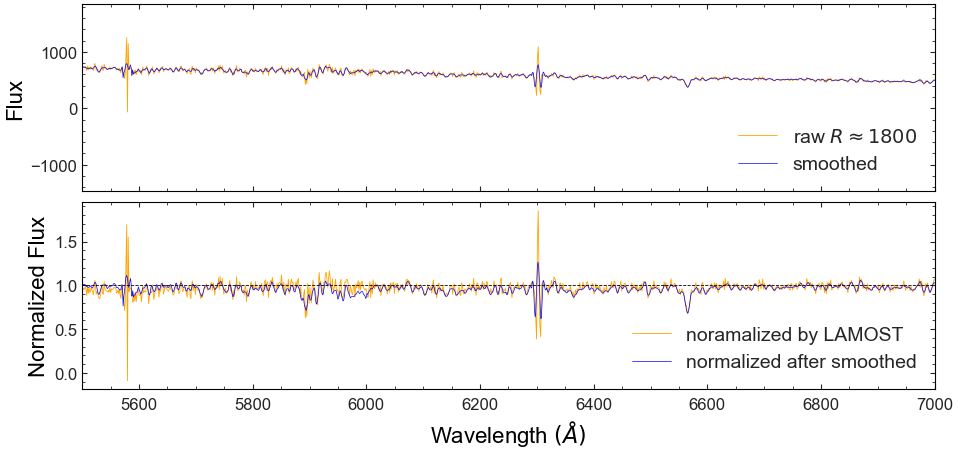

In [25]:
reload(h)
# 画出smooth处理的光谱
error_file = '../data/spec/spec-56812-VB231N08V1_sp15-007.fits'
w,wave,f,f_smooth,f_normed_smooth,f_norm_fromfile,f_check = h.flux_norm(error_file)

fig,axes = plt.subplots(2,1,sharex=True,figsize=(11,5))
axes[0].plot(w,f,linewidth=0.6,color='orange',label = 'raw $ R\\approx 1800$')
axes[0].plot(w,f_smooth,'-',linewidth=0.5,color='blue',label = 'smoothed')
axes[0].set_ylabel('Flux')
axes[0].legend(loc='lower right')
axes[0].set_xlim(5500,7000)

axes[1].plot(w,f_norm_fromfile,linewidth=0.6,color='orange',label = 'noramalized by LAMOST')
axes[1].plot(wave,f_normed_smooth,'-',linewidth=0.5,color='blue',label = 'normalized after smoothed')
axes[1].axhline(1,linewidth=0.6,color='k',linestyle="--")
axes[1].set_ylabel('Normalized Flux')
axes[1].legend(loc='lower right')
axes[1].set_xlim(5500,7000)

axes[1].set_xlabel('Wavelength $(\AA)$')
fig.subplots_adjust(wspace =0, hspace =0.06)#调整子图间距
plt.savefig('../figure/preprocess_smooth.pdf')


/Users/sara/PycharmProjects/specparam/header.py:184: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, 5)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProjects/specparam/header.py:228: RankWarning: Polyfit may be poorly conditioned
  coeff = np.polyfit(wave, flux, nploy)
/Users/sara/PycharmProje

max: 32273.709
max: 9.15505


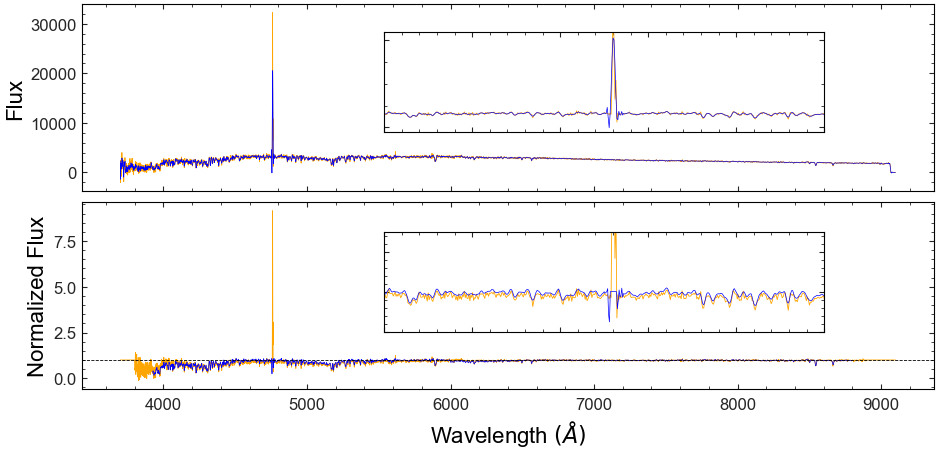

In [50]:
# 画出阈值检测处理的光谱
error_file = '../data/spec/spec-56339-HD094642N450651B01_sp15-221.fits'
w,wave,f,f_smooth,f_normed_smooth,f_norm_fromfile,f_check = h.flux_norm(error_file)

fig,axes = plt.subplots(2,1,sharex=True,figsize=(11,5))
axes[0].plot(w,f,linewidth=0.6,color='orange',label = 'raw $ R\\approx 1800$')
axes[0].plot(w,f_smooth,'-',linewidth=0.5,color='blue',label = 'smoothed')
axes[0].set_ylabel('Flux')
# axes[0].legend(loc='upper right')
print('max:',np.max(f))

left, bottom, width, height = 0.4, 0.625, 0.4, 0.2
ax1 = fig.add_axes([left, bottom, width, height])
ax1.plot(w,f,linewidth=0.6,color='orange',label = 'raw $ R\\approx 1800$')
ax1.plot(w,f_smooth,'-',linewidth=0.5,color='blue',label = 'smoothed')
ax1.xaxis.set_ticklabels([])
ax1.yaxis.set_ticklabels([])
ax1.set_xlim(4500,5000)
ax1.set_ylim(-1000, 22000)

axes[1].plot(w,f_norm_fromfile,linewidth=0.6,color='orange',label = 'noramalized by LAMOST')
axes[1].plot(wave,f_check,'-',linewidth=0.5,color='blue',label = 'normalized after smoothed and correction')
axes[1].axhline(1,linewidth=0.6,color='k',linestyle="--")
axes[1].set_ylabel('Normalized Flux')
# axes[1].legend(loc='upper right')
print('max:',np.max(f_norm_fromfile))

left, bottom, width, height = 0.4, 0.225, 0.4, 0.2
ax2 = fig.add_axes([left, bottom, width, height])
ax2.plot(w,f_norm_fromfile,linewidth=0.6,color='orange',label = 'noramalized by LAMOST')
ax2.plot(wave,f_check,'-',linewidth=0.5,color='blue',label = 'normalized after smoothed and correction')
ax2.xaxis.set_ticklabels([])
ax2.yaxis.set_ticklabels([])
ax2.set_xlim(4500,5000)
ax2.set_ylim(0, 2.5)

axes[1].set_xlabel('Wavelength $(\AA)$')
fig.subplots_adjust(wspace =0, hspace =0.06)#调整子图间距
fig.savefig('../figure/preprocess_threshold.pdf')

/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be

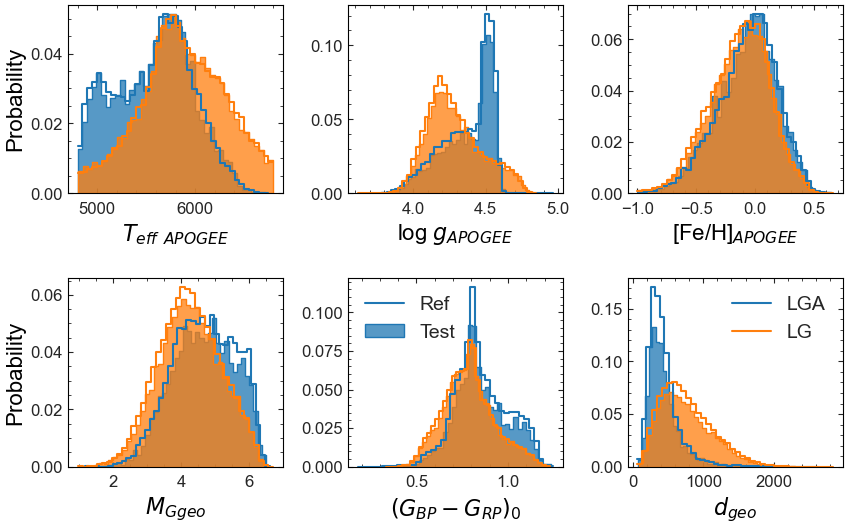

In [75]:
data1 = pd.read_csv(LAMOST_Gaia_APOGEE_path)
labels1 = ['TEFF_1','LOGG_1','feh','mg_geo','bp_rp_0','r_med_geo']
data2 = pd.read_csv(LAMOST_Gaia_path)
labels2 = ['teff_2','logg_2','feh','mg_geo','bp_rp_0','r_med_geo']

y1 = data1.loc[:, labels1]
y2 = data2.loc[:, labels2]
ytrain1, ytest1 = train_test_split(y1, test_size = 0.2, random_state = 42, shuffle = True)
ytrain2, ytest2 = train_test_split(y2, test_size = 0.2, random_state = 42, shuffle = True)

xlabels = ['$T_{eff}$'+' $_{APOGEE}$','log $g_{APOGEE}$','[Fe/H]$_{APOGEE}$',
           '$M_{Ggeo}$','$(G_{BP}-G_{RP})_{0}$','$d_{geo}$']

fig = plt.figure(figsize=(10,6))
gs = GridSpec(2, 3, figure=fig, hspace=0.45, wspace=0.3)
# plt.style.use('mystyle.mplstyle')

bins = 40
stat='probability'
element='step'

for i in range(6):
    row = int(i/3)
    col = int(i%3)
    ax = fig.add_subplot(gs[row, col])
    aux_train1 = ytrain1[labels1[i]]
    aux_test1 = ytest1[labels1[i]]
    aux_train2 = ytrain2[labels2[i]]
    aux_test2 = ytest2[labels2[i]]
    if i == 4:
        sns.histplot(aux_train1, bins=bins, stat=stat, element=element, fill=False, label = 'Ref') # , color='#CDD5E7'
        sns.histplot(aux_test1, bins=bins, stat=stat, element=element, fill=True, label='Test') # , color='#CDD5E7'
        sns.histplot(aux_train2, bins=bins, stat=stat, element=element, fill=False) # , color='#CFE6D4'
        sns.histplot(aux_test2, bins=bins, stat=stat, element=element, fill=True) # , color='#CFE6D4'
        ax.legend()
    else : 
        sns.histplot(aux_train1, bins=bins, stat=stat, element=element, fill=False, label = 'LGA') # , color='#CDD5E7'
        sns.histplot(aux_test1, bins=bins, stat=stat, element=element, fill=True) # , color='#CDD5E7'
        sns.histplot(aux_train2, bins=bins, stat=stat, element=element, fill=False, label = 'LG') # , color='#CFE6D4'
        sns.histplot(aux_test2, bins=bins, stat=stat, element=element, fill=True) # , color='#CFE6D4'
    ax.set_xlabel(xlabels[i])
    if i == 5:
        ax.legend()
    if col == 1 or col == 2:
        ax.set_ylabel('')
        
fig.savefig('../figure/distribution_labels.pdf')

In [28]:
'''
画出不同 卷积+全连接组合 的损失函数训练历史
'''
def draw_model_selection_history(data,historypath,ax):
    for i in range(len(historypath)):
        number = historypath[i][55:57]
        if i == 0 :
            history = pd.read_csv(historypath[i])
            history.columns = ['loss_'+number, 'val_loss_'+number]
        else:
            temp = pd.read_csv(historypath[i])
            temp.columns = ['loss_'+number, 'val_loss_'+number]
            history = pd.concat([history,temp],axis=1)
        
    #fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=200,layout='tight')
    # 32, 34, 44, 45
    c = ['r','b','c','g']
    labels = ['3+2 loss','3+2 val_loss','3+4 loss','3+4 val_loss','4+4 loss','4+4 val_loss','4+5 loss','4+5 val_loss']
    
    for i in range(len(historypath)):
        ax.plot(history.iloc[:,2*i],c=c[i],linestyle='-',label = labels[2*i])
        ax.plot(history.iloc[:,2*i+1],c=c[i],linestyle=':',label = labels[2*i+1])
        ax.set_xlim((0,40))
        ax.legend(loc='upper right')
        
    if data == 'LAMOST_Gaia_APOGEE':
        ax.set_ylabel('MSE ( LAMOST-Gaia-APOGEE )')
    elif data == 'LAMOST_Gaia':
        ax.set_ylabel('MSE ( LAMOST-Gaia )')
        
    ax.set_ylim(0,0.3)
    if data == 'LAMOST_Gaia_APOGEE':
        ax.set_ylim(0,0.2)
    ax.set_xlabel('Epoch')
    #fig.savefig('./model_selection_'+data+'.png')

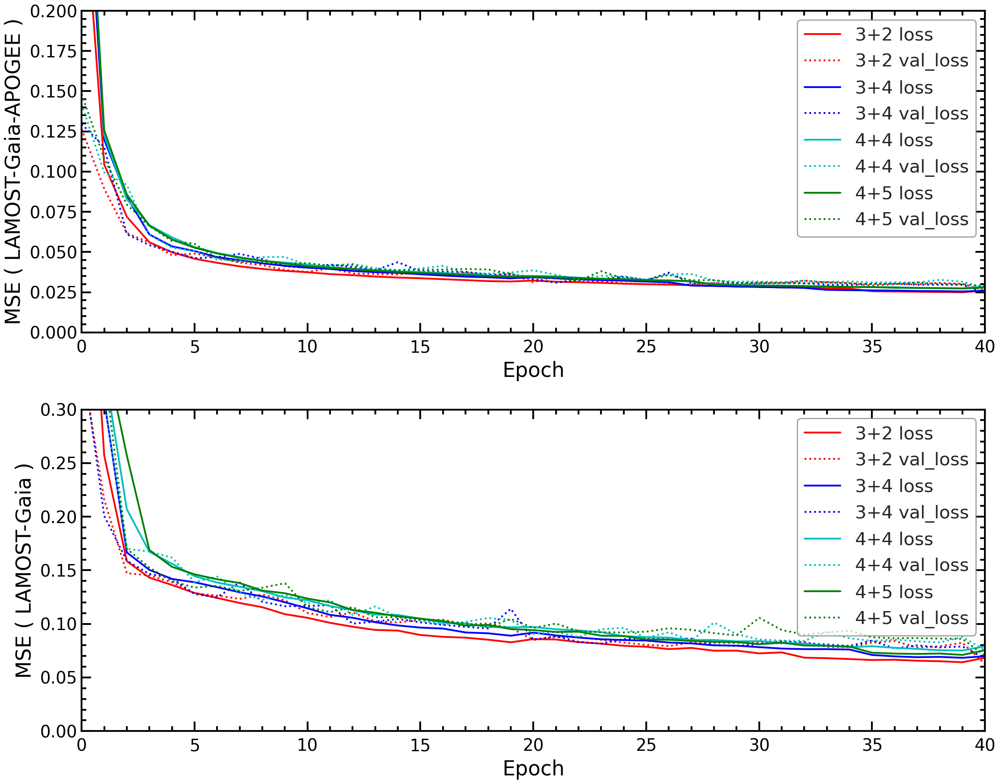

In [33]:
LAMOST_Gaia_dir = '/Volumes/Vega/data/dataset/LAMOST-Gaia/'
LAMOST_Gaia_APOGEE_dir = '/Volumes/Vega/data/dataset/LAMOST-Gaia-APOGEE/'
history_filepath = ['history_32.csv','history_34.csv','history_44.csv','history_45.csv']

historypath_LGA = []
for i in range(len(history_filepath)):
    historypath_LGA.append(LAMOST_Gaia_dir + history_filepath[i])
historypath_LG = []
for i in range(len(history_filepath)):
    historypath_LG.append(LAMOST_Gaia_APOGEE_dir + history_filepath[i])
    
fig = plt.figure(figsize=(12,9.5),dpi=200,layout='tight')
gs = GridSpec(2, 1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
draw_model_selection_history('LAMOST_Gaia_APOGEE',historypath_LGA,ax1)
ax2 = fig.add_subplot(gs[1,0])
draw_model_selection_history('LAMOST_Gaia',historypath_LG,ax2)

plt.savefig('./model_selection.png',bbox_inches='tight',pad_inches=0.02)


In [18]:
# .csv 为样本总表（不包含输入）， _param.csv仅包含输入输出，两表obsid顺序相同
LAMOST_Gaia_path = '/Volumes/Vega/data/dataset/LAMOST-Gaia/LAMOST_Gaia.csv'
LAMOST_Gaia_parampath = '/Volumes/Vega/data/dataset/LAMOST-Gaia/LAMOST_Gaia_param.csv'
LAMOST_Gaia_APOGEE_path = '/Volumes/Vega/data/dataset/LAMOST-Gaia-APOGEE/LAMOST_Gaia_APOGEE.csv'
LAMOST_Gaia_APOGEE_parampath = '/Volumes/Vega/data/dataset/LAMOST-Gaia-APOGEE/LAMOST_Gaia_APOGEE_param.csv'

LAMOST_Gaia_dir = '/Volumes/Vega/data/dataset/LAMOST-Gaia/'
LAMOST_Gaia_APOGEE_dir = '/Volumes/Vega/data/dataset/LAMOST-Gaia-APOGEE/'

scaler_filepath = 'std_scaler_cutdata.bin'
model_filepath = 'model_32_cutdata'
scaler_filepath = 'std_scaler.bin'
model_filepath = 'model_32'
history_filepath = ['history_32.csv','history_34.csv','history_44.csv','history_45.csv']

data = 'LAMOST_Gaia_APOGEE'

historypath = []
if data == 'LAMOST_Gaia':
    datapath = LAMOST_Gaia_parampath
    dataallpath = LAMOST_Gaia_path
    scalerpath = LAMOST_Gaia_dir + scaler_filepath
    modelpath = LAMOST_Gaia_dir + model_filepath
    for i in range(len(history_filepath)):
        historypath.append(LAMOST_Gaia_dir + history_filepath[i])
elif data == 'LAMOST_Gaia_APOGEE':
    datapath = LAMOST_Gaia_APOGEE_parampath
    dataallpath = LAMOST_Gaia_APOGEE_path
    scalerpath = LAMOST_Gaia_APOGEE_dir + scaler_filepath
    modelpath = LAMOST_Gaia_APOGEE_dir + model_filepath
    for i in range(len(history_filepath)):
        historypath.append(LAMOST_Gaia_APOGEE_dir + history_filepath[i])
        
dataall = pd.read_csv(dataallpath)
dataset = pd.read_csv(datapath)
labels = ['teff','logg','feh','mg_geo','bp_rp_0']
X = dataset.iloc[:,7:4882]
y = dataset.loc[:,labels]
obsid = dataset.loc[:,'obsid']

# 以 8:2 的比例划分训练集和测试集，obsid_train 为 y_train 顺序对应的 obsid
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, shuffle = True)
obsid_train, obsid_test = train_test_split(obsid, test_size = 0.2, random_state = 42, shuffle = True)

# 读取标准化参数
scaler = load(scalerpath)
# 对训练集和测试集标准化
# y_test.values[:] = scaler.transform(y_test)
y_test = scaler.transform(y_test)
# y_train.values[:] = scaler.transform(y_train)

# size for the sets
print('size of X_train:', X_train.shape,'size of y_train:', y_train.shape)
print('size of X_test:', X_test.shape,'size of y_test:', y_test.shape)
# Reshape train and test data to (n_samples, 187, 1), where each sample is of size (187, 1)
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = np.array(y_train).reshape(y_train.shape[0], y_train.shape[1])
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)
y_test = np.array(y_test).reshape(y_test.shape[0], y_test.shape[1])
print("reshape X_train: ", X_train.shape,"reshape y_train: ", y_train.shape)
print("reshape X_test: ", X_test.shape,"reshape y_test: ", y_test.shape)

# 读取模型
model = tf.keras.models.load_model(modelpath)

prediction = pd.DataFrame(scaler.inverse_transform(model.predict(X_test)))
prediction.columns = ['pre_teff','pre_logg','pre_feh','pre_mg_geo','pre_bp_rp_0']

obsid_test = obsid_test.reset_index(drop=True)
prediction['obsid'] = obsid_test

test = prediction.merge(dataall,how='left',on='obsid')

/Users/sara/miniconda3/envs/specparam/lib/python3.9/site-packages/sklearn/base.py:347: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.0.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


size of X_train: (14858, 4875) size of y_train: (14858, 5)
size of X_test: (3715, 4875) size of y_test: (3715, 5)
reshape X_train:  (14858, 4875, 1) reshape y_train:  (14858, 5)
reshape X_test:  (3715, 4875, 1) reshape y_test:  (3715, 5)
117/117 [==============================] - 4s 34ms/step


In [19]:
data ='LAMOST_Gaia_APOGEE'
if data == 'LAMOST_Gaia_APOGEE':
    ori_teff = test['TEFF_1']
    ori_logg = test['LOGG_1']
    ori_feh = test['FE_H']
    x_label = ['$T_{eff}$'+' $_{APOGEE}$','log $g_{APOGEE}$','[Fe/H]$_{APOGEE}$','$M_{Ggeo}$','$(G_{BP}-G_{RP})_{0}$','$d_{geo}$']
    y_label = ['$T_{eff}$'+' $_{CNN}$','log $g_{CNN}$','[Fe/H]$_{CNN}$','$M_{Ggeo}$'+' $_{CNN}$','$(G_{BP}-G_{RP})_{0}$'+' $_{CNN}$','$d_{geo}$'+' $_{CNN}$']
elif data == 'LAMOST_Gaia':
    ori_teff = test['teff_2']
    ori_logg = test['logg_2']
    ori_feh = test['feh']
    x_label = ['$T_{eff}$'+' $_{LAMOST}$','log $g_{LAMOST}$','[Fe/H]$_{LAMOST}$','$M_{Ggeo}$','$(G_{BP}-G_{RP})_{0}$','$d_{geo}$']
    y_label = ['$T_{eff}$'+' $_{CNN2}$','log $g_{CNN2}$','[Fe/H]$_{CNN2}$','$M_{Ggeo}$'+' $_{CNN2}$','$(G_{BP}-G_{RP})_{0}$'+' $_{CNN2}$','$d_{geo}$'+' $_{CNN2}$']
ori_mg = test['mg_geo']
ori_bprp0 = test['bp_rp_0']

pre_labels = ['pre_teff','pre_logg','pre_feh','pre_mg_geo','pre_bp_rp_0']
pre_teff = test[pre_labels[0]]
pre_logg = test[pre_labels[1]]
pre_feh = test[pre_labels[2]]
pre_mg = test[pre_labels[3]]
pre_bprp0 = test[pre_labels[4]]

resid_teff = ori_teff - pre_teff
resid_logg = ori_logg - pre_logg
resid_feh = ori_feh - pre_feh
resid_mg = ori_mg - pre_mg
resid_bprp0 = ori_bprp0 - pre_bprp0

mu_teff, sigma_teff = np.mean(ori_teff - pre_teff), np.std(ori_teff - pre_teff)
mu_logg, sigma_logg = np.mean(ori_logg - pre_logg), np.std(ori_logg - pre_logg)
mu_feh, sigma_feh = np.mean(ori_feh - pre_feh), np.std(ori_feh - pre_feh)
mu_mg, sigma_mg = np.mean(ori_mg - pre_mg), np.std(ori_mg - pre_mg)
mu_bprp0, sigma_bprp0 = np.mean(ori_bprp0 - pre_bprp0), np.std(ori_bprp0 - pre_bprp0)

lim_teff = (min(min(ori_teff),min(pre_teff))-20, max(max(ori_teff),max(pre_teff))+20)
lim_logg = (min(min(ori_logg),min(pre_logg)), max(max(ori_logg),max(pre_logg)))
lim_feh = (min(min(ori_feh),min(pre_feh)), max(max(ori_feh),max(pre_feh)))
lim_mg = (min(min(ori_mg),min(pre_mg)), max(max(ori_mg),max(pre_mg)))
lim_bprp0 = (min(min(ori_bprp0),min(pre_bprp0)), max(max(ori_bprp0),max(pre_bprp0)))

print('sigma_mg : ',sigma_mg)

sigma_mg :  0.25464918408761095


In [20]:
from scipy.optimize import minimize_scalar
# 从预测的绝对星等 M 计算距离 d
# 假设绝对星等M服从正态分布 M～N(mu,sigma)
def p_M(M,mu,sigma):
    return 1/(np.sqrt(2*np.pi) * sigma) * np.exp(-(M-mu)**2 / (2*(sigma**2)))
# 根据概率密度传递公式推算得到的 距离的pdf
def p_d(d,m,mu_M,sigma_M,A):
    return np.abs(5/(d*np.log(10))) * p_M(M = m-5*np.log10(d)+5-A,mu = mu_M,sigma = sigma_M)

# 取反的 p_d(d)
def neg_p_d(d, m, mu_M, sigma_M, A):
    return -p_d(d, m, mu_M, sigma_M, A)

m = test['gaia_g_mean_mag']
mu_M = test['pre_mg_geo']
sigma_M = sigma_mg
test['cnn1_av'] = (test['bp_rp'] - test['pre_bp_rp_0']) / (1.08337-0.63439)
test['cnn1_ag'] = 0.83627 * (test['bp_rp'] - test['pre_bp_rp_0']) / (1.08337-0.63439)
A = test['cnn1_ag']
print(sigma_M)

# 初始化一个列表，用于存储每组数据的最大值所对应的 d 值
d_max_values = []

# 遍历每组数据
for m_i, mu_M_i, A_i in zip(m, mu_M, A):
    result = minimize_scalar(neg_p_d, args=(m_i, mu_M_i, sigma_M, A_i), bounds=(0, 1e4), method='bounded')
    d_max_values.append(result.x)

# 输出最大值所对应的 d 值
print("最大值所对应的 d 值：", d_max_values)

test['pre_d_med'] = d_max_values
# test['direct_d'] = 10 ** ((5-test['azero_gspphot']+test['gaia_g_mean_mag']-test['pre_mg_geo']) / 5)
test['direct_d'] = 10 ** ((5-test['cnn1_ag']+test['gaia_g_mean_mag']-test['pre_mg_geo']) / 5)

0.25464918408761095
最大值所对应的 d 值： [166.29392102026995, 421.66054216729157, 474.371827047104, 268.2689236276857, 440.5962686286659, 208.80248703193374, 372.9093023402987, 872.6653026772037, 312.13503202658785, 312.5204619918473, 449.81580924592896, 836.985968463036, 397.9382793036637, 467.2557793853942, 431.3077595839198, 340.2838383095715, 479.4298769985031, 210.76555083576707, 170.55805414671687, 927.4149384768592, 512.8712648035306, 200.68489799088744, 303.23253455158994, 331.6818709705676, 444.24533542192995, 249.6389136488346, 423.88768536033155, 494.6719448864317, 506.0324251549444, 566.8590415482885, 542.8070307007127, 320.9694209091049, 323.99792088243794, 263.5831181085626, 273.953589560462, 779.2717759491738, 288.08716651080766, 298.82834386714046, 275.11042546654403, 656.2907711668086, 380.89171714260294, 334.7685356605004, 371.1018033375297, 210.82389356292995, 441.2461320951162, 577.2180307948552, 326.29854393369305, 543.1764624644557, 191.64777481855626, 881.0385854909792, 

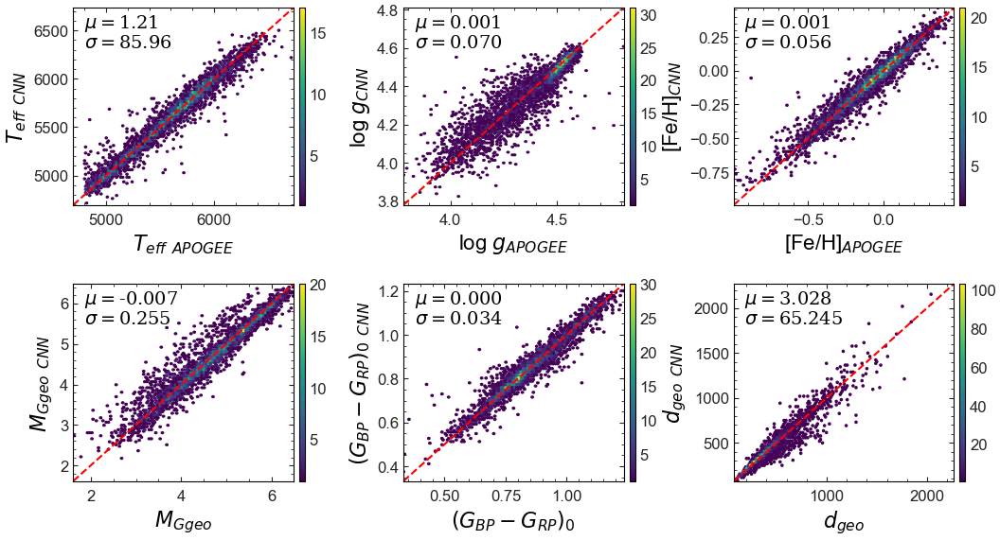

In [21]:
# 画出测试集的预测结果
def add_right_cax(ax, pad, width):
    '''
    在一个ax右边追加与之等高的cax.
    pad是cax与ax的间距,width是cax的宽度.
    '''
    axpos = ax.get_position()
    caxpos = mtransforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

fig = plt.figure(figsize=(12,6.5))
gs = GridSpec(2, 3, figure=fig, wspace=0.5, hspace=0.4)
fontdict = {'size':14, 'color':'k', 'family':'serif'}

def subplot(gsx,gsy,datax,datay,labelnum,lim,datamu,datasigma,fnum):
    ax = fig.add_subplot(gs[gsx,gsy])
    hb = ax.hexbin(datax,datay,gridsize=100,mincnt=1, cmap='viridis')
    # 设置的colorbar
    cax = add_right_cax(ax, pad=0.005, width=0.005)
    cb = fig.colorbar(hb, cax=cax)
    # cb.ax.set_title('Count')
    ax.plot([0,1],[0,1],transform=ax.transAxes, ls='--',c='r')
    ax.set_xlabel(x_label[labelnum])
    ax.set_ylabel(y_label[labelnum])
    ax.set_xlim(lim)
    ax.set_ylim(lim)
    if fnum == 2: # 保留两位小数
        ax.text(0.05,0.9,'$\mu=$'+'%.2f'%(datamu),transform=ax.transAxes,fontdict=fontdict)
        ax.text(0.05,0.8,'$\sigma=$'+'%.2f'%(datasigma),transform=ax.transAxes,fontdict=fontdict)
    elif fnum == 3: # 保留三位小数
        ax.text(0.05,0.9,'$\mu=$'+'%.3f'%(datamu),transform=ax.transAxes,fontdict=fontdict)
        ax.text(0.05,0.8,'$\sigma=$'+'%.3f'%(datasigma),transform=ax.transAxes,fontdict=fontdict, color='k')        
    return 

subplot(gsx=0, gsy=0, datax=ori_teff, datay=pre_teff, labelnum=0, lim=lim_teff, datamu=mu_teff, datasigma=sigma_teff, fnum=2)
subplot(gsx=0, gsy=1, datax=ori_logg, datay=pre_logg, labelnum=1, lim=lim_logg, datamu=mu_logg, datasigma=sigma_logg, fnum=3)
subplot(gsx=0, gsy=2, datax=ori_feh, datay=pre_feh, labelnum=2, lim=lim_feh, datamu=mu_feh, datasigma=sigma_feh, fnum=3)
subplot(gsx=1, gsy=0, datax=ori_mg, datay=pre_mg, labelnum=3, lim=lim_mg, datamu=mu_mg, datasigma=sigma_mg, fnum=3)
subplot(gsx=1, gsy=1, datax=ori_bprp0, datay=pre_bprp0, labelnum=4, lim=lim_bprp0, datamu=mu_bprp0, datasigma=sigma_bprp0, fnum=3)

ori_d = test['r_med_geo']
pre_d = test['direct_d']  ## pre_d_med
resid_d = ori_d - pre_d
mu_d, sigma_d = np.mean(ori_d - pre_d), np.std(ori_d - pre_d)
lim_d = (min(min(ori_d),min(pre_d)), max(max(ori_d),max(pre_d)))
subplot(gsx=1, gsy=2, datax=ori_d, datay=pre_d, labelnum=5, lim=lim_d, datamu=mu_d, datasigma=sigma_d, fnum=3)


plt.savefig('../figure/test_result_'+data+'_withdis.pdf')

In [117]:
bad_dis_plx_outputpath = '../data/application/bad_dis_plx_outputparam.csv'
test = pd.read_csv(bad_dis_plx_outputpath)


ori_teff = test['cnn2_teff']
ori_logg = test['cnn2_logg']
ori_feh = test['cnn2_feh']
ori_mg = test['cnn2_mg']
ori_bprp0 = test['cnn2_bprp']

x_label = ['$T_{eff}$'+' $_{CNN2}$','log $g_{CNN2}$','[Fe/H]$_{CNN2}$','$M_{Ggeo}$'+' $_{CNN2}$','$(G_{BP}-G_{RP})_{0}$'+' $_{CNN2}$','$d_{geo}$'+' $_{CNN2}$ (kpc)']
y_label = ['$T_{eff}$'+' $_{CNN1}$','log $g_{CNN1}$','[Fe/H]$_{CNN1}$','$M_{Ggeo}$'+' $_{CNN1}$','$(G_{BP}-G_{RP})_{0}$'+' $_{CNN1}$','$d_{geo}$'+' $_{CNN1}$ (kpc)']

pre_labels = ['cnn1_teff','cnn1_logg','cnn1_feh','cnn1_mg','cnn1_bprp']
pre_teff = test[pre_labels[0]]
pre_logg = test[pre_labels[1]]
pre_feh = test[pre_labels[2]]
pre_mg = test[pre_labels[3]]
pre_bprp0 = test[pre_labels[4]]

resid_teff = ori_teff - pre_teff
resid_logg = ori_logg - pre_logg
resid_feh = ori_feh - pre_feh
resid_mg = ori_mg - pre_mg
resid_bprp0 = ori_bprp0 - pre_bprp0

mu_teff, sigma_teff = np.mean(ori_teff - pre_teff), np.std(ori_teff - pre_teff)
mu_logg, sigma_logg = np.mean(ori_logg - pre_logg), np.std(ori_logg - pre_logg)
mu_feh, sigma_feh = np.mean(ori_feh - pre_feh), np.std(ori_feh - pre_feh)
mu_mg, sigma_mg = np.mean(ori_mg - pre_mg), np.std(ori_mg - pre_mg)
mu_bprp0, sigma_bprp0 = np.mean(ori_bprp0 - pre_bprp0), np.std(ori_bprp0 - pre_bprp0)

lim_teff = (min(min(ori_teff),min(pre_teff))-20, max(max(ori_teff),max(pre_teff))+20)
lim_logg = (min(min(ori_logg),min(pre_logg)), max(max(ori_logg),max(pre_logg)))
lim_feh = (min(min(ori_feh),min(pre_feh)), max(max(ori_feh),max(pre_feh)))
lim_mg = (min(min(ori_mg),min(pre_mg)), max(max(ori_mg),max(pre_mg)))
lim_bprp0 = (min(min(ori_bprp0),min(pre_bprp0)), max(max(ori_bprp0),max(pre_bprp0)))

/var/folders/pc/px2hh_yx5kx7bc_h03thddh00000gn/T/ipykernel_63475/2384981725.py:2: DtypeWarning: Columns (12,13,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv(bad_dis_plx_outputpath)


In [115]:
# from scipy.optimize import minimize_scalar
# # 从预测的绝对星等 M 计算距离 d
# # 假设绝对星等M服从正态分布 M～N(mu,sigma)
# def p_M(M,mu,sigma):
#     return 1/(np.sqrt(2*np.pi) * sigma) * np.exp(-(M-mu)**2 / (2*(sigma**2)))
# # 根据概率密度传递公式推算得到的 距离的pdf
# def p_d(d,m,mu_M,sigma_M,A):
#     return np.abs(5/(d*np.log(10))) * p_M(M = m-5*np.log10(d)+5-A,mu = mu_M,sigma = sigma_M)
# 
# # 取反的 p_d(d)
# def neg_p_d(d, m, mu_M, sigma_M, A):
#     return -p_d(d, m, mu_M, sigma_M, A)
# 
# m = test['gaia_g_mean_mag']
# mu_M1 = test['cnn1_mg']
# mu_M2 = test['cnn2_mg']
# sigma_M1 = 0.2546491913284351 # LGA的测试集的sigma_mg
# sigma_M2 = 0.2214733394371884 # LG的测试集的sigma_mg
# A = test['azero_gspphot']
# 
# # 初始化一个列表，用于存储每组数据的最大值所对应的 d 值
# d_max_values1 = []
# d_max_values2 = []
# 
# # 遍历每组数据
# for m_i, mu_M_i, A_i in zip(m, mu_M1, A):
#     result = minimize_scalar(neg_p_d, args=(m_i, mu_M_i, sigma_M1, A_i), bounds=(0, 2e4), method='bounded')
#     d_max_values1.append(result.x)
# 
# for m_i, mu_M_i, A_i in zip(m, mu_M2, A):
#     result = minimize_scalar(neg_p_d, args=(m_i, mu_M_i, sigma_M2, A_i), bounds=(0, 2e4), method='bounded')
#     d_max_values2.append(result.x)
# 
# # 输出最大值所对应的 d 值
# print("最大值所对应的 cnn1_d 值：", d_max_values1)
# print("最大值所对应的 cnn2_d 值：", d_max_values2)
# 
# test['cnn1_pre_d_med'] = d_max_values1
# test['cnn2_pre_d_med'] = d_max_values2
# # test['cnn1_direct_d'] = 10 ** ((5-test['azero_gspphot']+test['gaia_g_mean_mag']-test['cnn1_mg']) / 5)
# # test['cnn2_direct_d'] = 10 ** ((5-test['azero_gspphot']+test['gaia_g_mean_mag']-test['cnn2_mg']) / 5)
# test['cnn1_direct_d'] = 10 ** ((5+test['gaia_g_mean_mag']-test['cnn1_mg']) / 5)
# test['cnn2_direct_d'] = 10 ** ((5+test['gaia_g_mean_mag']-test['cnn2_mg']) / 5)

KeyError: 'cnn1_mg'

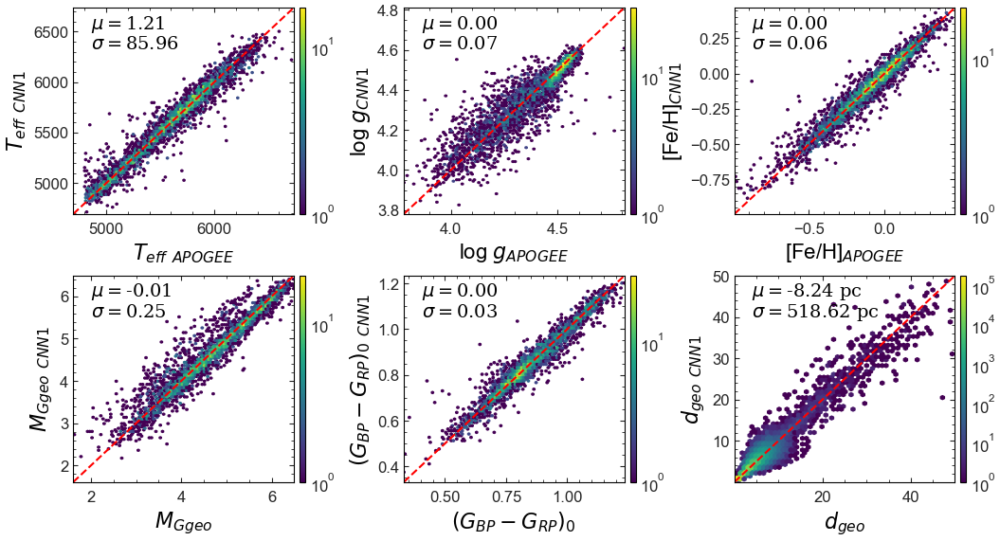

In [148]:
# 画出测试集的预测结果
def add_right_cax(ax, pad, width):
    '''
    在一个ax右边追加与之等高的cax.
    pad是cax与ax的间距,width是cax的宽度.
    '''
    axpos = ax.get_position()
    caxpos = mtransforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

fig = plt.figure(figsize=(12,6.5))
gs = GridSpec(2, 3, figure=fig, wspace=0.5, hspace=0.3)
fontdict = {'size':14, 'color':'k', 'family':'serif'}

def subplot(gsx,gsy,datax,datay,labelnum,lim,datamu,datasigma,fnum):
    ax = fig.add_subplot(gs[gsx,gsy])
    hb = ax.hexbin(datax,datay,gridsize=100,bins='log',mincnt=1, cmap='viridis')
    # 设置的colorbar
    cax = add_right_cax(ax, pad=0.005, width=0.005)
    cb = fig.colorbar(hb, cax=cax)
    # cb.ax.set_title('Count')

    ax.plot([0,1],[0,1],transform=ax.transAxes, ls='--',c='r')
    ax.set_xlabel(x_label[labelnum])
    ax.set_ylabel(y_label[labelnum])
    ax.set_xlim(lim)
    ax.set_ylim(lim)
    if fnum == 2: # 保留两位小数
        ax.text(0.08,0.9,'$\mu=$'+'%.2f'%(datamu),transform=ax.transAxes,fontdict=fontdict)
        ax.text(0.08,0.8,'$\sigma=$'+'%.2f'%(datasigma),transform=ax.transAxes,fontdict=fontdict)
    elif fnum == 3: # 保留三位小数
        if labelnum == 5:
            ax.text(0.08,0.9,'$\mu=$'+'%.2f pc'%(datamu),transform=ax.transAxes,fontdict=fontdict)
            ax.text(0.08,0.8,'$\sigma=$'+'%.2f pc'%(datasigma),transform=ax.transAxes,fontdict=fontdict)
        else:
            ax.text(0.08,0.9,'$\mu=$'+'%.2f'%(datamu),transform=ax.transAxes,fontdict=fontdict)
            ax.text(0.08,0.8,'$\sigma=$'+'%.2f'%(datasigma),transform=ax.transAxes,fontdict=fontdict)    
    return 

subplot(gsx=0, gsy=0, datax=ori_teff, datay=pre_teff, labelnum=0, lim=lim_teff, datamu=mu_teff, datasigma=sigma_teff, fnum=2)
subplot(gsx=0, gsy=1, datax=ori_logg, datay=pre_logg, labelnum=1, lim=lim_logg, datamu=mu_logg, datasigma=sigma_logg, fnum=3)
subplot(gsx=0, gsy=2, datax=ori_feh, datay=pre_feh, labelnum=2, lim=lim_feh, datamu=mu_feh, datasigma=sigma_feh, fnum=3)
subplot(gsx=1, gsy=0, datax=ori_mg, datay=pre_mg, labelnum=3, lim=lim_mg, datamu=mu_mg, datasigma=sigma_mg, fnum=3)
subplot(gsx=1, gsy=1, datax=ori_bprp0, datay=pre_bprp0, labelnum=4, lim=lim_bprp0, datamu=mu_bprp0, datasigma=sigma_bprp0, fnum=3)

ori_d = test['cnn2_direct_d']
pre_d = test['cnn1_direct_d']
resid_d = ori_d - pre_d
mu_d, sigma_d = np.mean(ori_d - pre_d), np.std(ori_d - pre_d)
ori_d = ori_d/1000
pre_d = pre_d/1000
# lim_d = (min(min(ori_d),min(pre_d)), max(max(ori_d),max(pre_d)))
lim_d = (min(min(ori_d),min(pre_d)), 50)
subplot(gsx=1, gsy=2, datax=ori_d, datay=pre_d, labelnum=5, lim=lim_d, datamu=mu_d, datasigma=sigma_d, fnum=3)

plt.savefig('../figure/application_comparison_withDirectdis.pdf')

In [224]:
from astropy.coordinates import SkyCoord
from astropy import units as u
import numpy as np
bad_dis_plx_outputpath = '../data/application/bad_dis_plx/bad_dis_plx_outputparam.csv'
test = pd.read_csv(bad_dis_plx_outputpath)

# 输入：赤经、赤纬和距离
ra1 = test['RA_1'] * u.degree  # 赤经（单位：度）
dec1 = test['DEC_1'] * u.degree # 赤纬（单位：度）
d1 = test['cnn1_direct_d'] * u.pc   # 距离太阳的距离（单位：pc）

ra2 = test['ra_2'] * u.degree  # 赤经（单位：度）
de2 = test['dec_2'] * u.degree # 赤纬（单位：度）
d2 = test['cnn2_direct_d'] * u.pc   # 距离太阳的距离（单位：pc）

# 创建一个天球坐标对象
c1 = SkyCoord(ra = ra1, dec1, distance=d)

# 将天球坐标转换为银道坐标
galactic = c1.transform_to('galactic')

# 计算天体距离银道平面的高度z和在银道平面上的投影距离r
b = galactic.b.radian  # 银道纬度（单位：弧度）
d1 = galactic.distance  # 距离太阳的距离（单位：pc）
d2 = galactic.distance  # 距离太阳的距离（单位：pc）

z1 = d1 * np.sin(b)
r1 = d1 * np.cos(b)

z2 = d2 * np.sin(b)
r2 = d2 * np.cos(b)

print(f"天体距离银道面的高度（单位：pc）: {z1}")
print(f"天体在银道面上的投影距离太阳的距离（单位：pc）: {r1}")

print(f"天体距离银道面的高度（单位：pc）: {z2}")
print(f"天体在银道面上的投影距离太阳的距离（单位：pc）: {r2}")

test['cnn1_R'] = r1.value
test['cnn1_Z'] = z1.value

test['cnn2_R'] = r2.value
test['cnn2_Z'] = z2.value   

天体距离银道面的高度（单位：pc）: [-2225.67275066 -2595.66323641 -1991.04000674 ...  3056.49353102
   713.34327918   588.5200837 ] pc
天体在银道面上的投影距离太阳的距离（单位：pc）: [2361.113306   2791.53944575 2100.56828715 ... 1307.82461684  320.31964025
   18.86343281] pc
天体距离银道面的高度（单位：pc）: [-2225.67275066 -2595.66323641 -1991.04000674 ...  3056.49353102
   713.34327918   588.5200837 ] pc
天体在银道面上的投影距离太阳的距离（单位：pc）: [2361.113306   2791.53944575 2100.56828715 ... 1307.82461684  320.31964025
   18.86343281] pc


In [147]:
import astropy.coordinates as coord
from astropy import units as u
import numpy as np
bad_dis_plx_outputpath = '../data/application/bad_dis_plx_outputparam.csv'
test = pd.read_csv(bad_dis_plx_outputpath)

c1 = coord.SkyCoord(ra=test['RA_1'] * u.degree,
                   dec=test['DEC_1'] * u.degree,
                   distance=test['cnn1_direct_d'] * u.kpc,
                   frame='icrs')
galactocentric1 = c1.transform_to(coord.Galactocentric)
test['R_gc'] = math.sqrt((galactocentric1.x.value)**2 + (galactocentric1.y.value)**2)
test['Z'] = galactocentric1.z.value

/var/folders/pc/px2hh_yx5kx7bc_h03thddh00000gn/T/ipykernel_63475/2754696678.py:5: DtypeWarning: Columns (12,13,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv(bad_dis_plx_outputpath)


UnitTypeError: Angle instances require units equivalent to 'rad', but no unit was given.

In [17]:
galactocentric1.x

<Quantity [    nan,     nan,     nan, ...,     nan,     nan, 11.1542] kpc>

In [4]:
import astropy.units as u
import astropy.coordinates as coord
c = coord.SkyCoord(ra=[158.3122, 24.5] * u.degree,
                   dec=[-17.3, 81.52] * u.degree,
                   distance=[11.5, 24.12] * u.kpc,
                   frame='icrs')
galactocentric = c.transform_to(coord.Galactocentric) 

/Users/sara/opt/anaconda3/envs/workspace/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


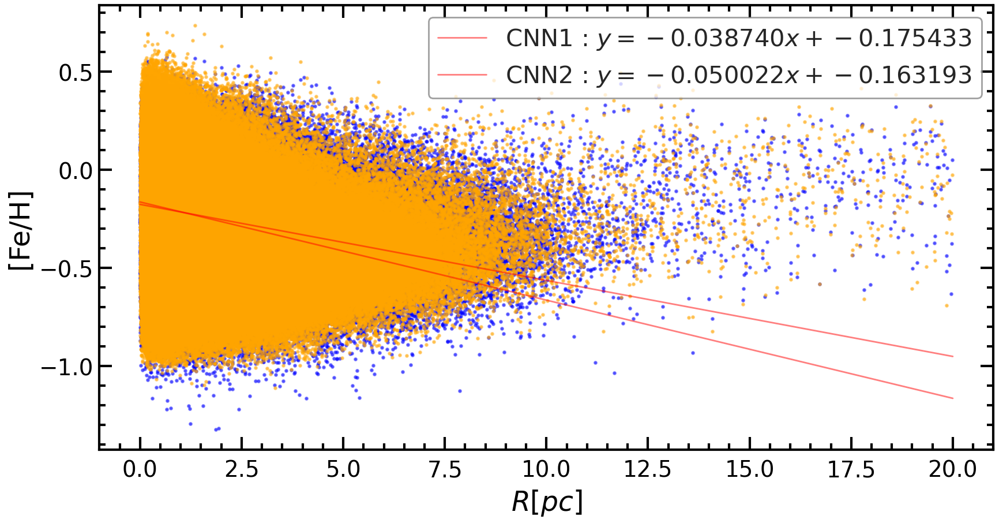

In [4]:
from scipy.optimize import curve_fit

feh1 = test[test['cnn1_R']<=20000]['cnn1_feh']
feh2 = test[test['cnn2_R']<=20000]['cnn2_feh']
r1 = test[test['cnn1_R']<=20000]['cnn1_R']/1000
r2 = test[test['cnn2_R']<=20000]['cnn2_R']/1000

# curve_fit
def f_1(x,a,b):
    return a*x + b

popt1,_ = curve_fit(f_1, xdata=r1, ydata=feh1)
popt2,_ = curve_fit(f_1, xdata=r2, ydata=feh2)
A1, B1 = popt1
A2, B2 = popt2

xfine = np.linspace(0, 20, 100)  # define values to plot the function for

fig,ax = plt.subplots(figsize=(10,5),dpi=200)
ax.scatter(r1,feh1,s=2,c='blue',alpha=0.5)
ax.scatter(r2,feh2,s=2,c='orange',alpha=0.5)
ax.plot(xfine,f_1(xfine,*popt1),c='r',linewidth=1,alpha=0.5,label='CNN1 : $y=%fx+%f$'%(A1,B1))
ax.plot(xfine,f_1(xfine,*popt2),c='r',linewidth=1,alpha=0.5,label='CNN2 : $y=%fx+%f$'%(A2,B2))

ax.set_xlabel('$R [pc]$')
ax.set_ylabel('[Fe/H]')
ax.legend()

In [6]:
from scipy.optimize import curve_fit
import pandas as pd
bad_dis_plx_outputpath = '../data/application/bad_dis_plx_outputparam.csv'
test = pd.read_csv(bad_dis_plx_outputpath)

/var/folders/pc/px2hh_yx5kx7bc_h03thddh00000gn/T/ipykernel_9582/839481883.py:4: DtypeWarning: Columns (12,13,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv(bad_dis_plx_outputpath)


/var/folders/pc/px2hh_yx5kx7bc_h03thddh00000gn/T/ipykernel_32401/664754587.py:3: DtypeWarning: Columns (12,13,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv(bad_dis_plx_outputpath)


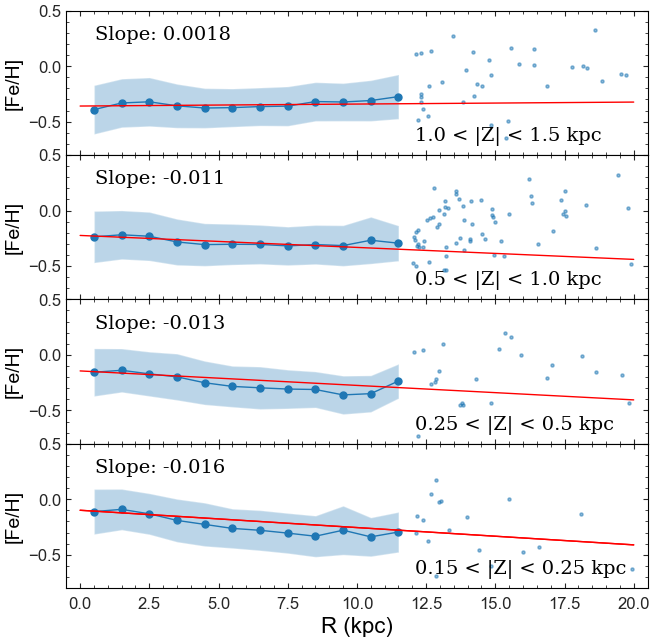

In [4]:
from scipy.optimize import curve_fit
bad_dis_plx_outputpath = '../data/application/bad_dis_plx_outputparam.csv'
test = pd.read_csv(bad_dis_plx_outputpath)
# curve_fit
def f_1(x,a,b):
    return a*x + b

fig, axs = plt.subplots(4, 1, figsize=(7.5, 7.5), sharex=True)
fontdict = {'size':14, 'color':'k', 'family':'serif'}
zbin = [1.5,1.0,0.5,0.25,0.15]
for i in range(4):
    r1 = test[(test['cnn1_R'] / 1000 <= 20) & ((abs(test['cnn1_Z'] / 1000) < zbin[i]) & (abs(test['cnn1_Z'] / 1000) > zbin[i + 1]))]['cnn1_R'] / 1000
    r2 = test[(test['cnn2_R'] / 1000 <= 20) & ((abs(test['cnn2_Z'] / 1000) < zbin[i]) & (abs(test['cnn2_Z'] / 1000) > zbin[i + 1]))]['cnn2_R'] / 1000
    feh1 = test[(test['cnn1_R'] / 1000 <= 20) & ((abs(test['cnn1_Z'] / 1000) < zbin[i]) & (abs(test['cnn1_Z'] / 1000) > zbin[i + 1]))]['cnn1_feh']
    feh2 = test[(test['cnn2_R'] / 1000 <= 20) & ((abs(test['cnn2_Z'] / 1000) < zbin[i]) & (abs(test['cnn2_Z'] / 1000) > zbin[i + 1]))]['cnn2_feh']
    
    # 分 bin 并计算 FEH 的均值和方差
    step = 1.0  # 步长为 1
    bins = np.arange(0, 12 + step, step)
    indices1 = np.digitize(r1, bins)
    indices2 = np.digitize(r2, bins)
    feh_mean1 = [feh1[indices1 == j].mean() for j in range(1, len(bins))]
    feh_std1 = [feh1[indices1 == j].std() for j in range(1, len(bins))]
    feh_mean2 = [feh2[indices2 == j].mean() for j in range(1, len(bins))]
    feh_std2 = [feh2[indices2 == j].std() for j in range(1, len(bins))]
    
    out1 = r1 > 12
    out2 = r2 > 12
    
    # 计算 x 值（每个 bin 的中心点）
    x_values = [(bins[j] + bins[j + 1]) / 2 for j in range(len(bins) - 1)]
    x_v2 = np.array(x_values) + 0.25
    
    popt1,_ = curve_fit(f_1, xdata=r1, ydata=feh1)
    popt2,_ = curve_fit(f_1, xdata=r2, ydata=feh2)
    A1, B1 = popt1
    A2, B2 = popt2
    xfine = np.linspace(0, 20, 100)
    
    ax = axs[i]
    # ax.errorbar(x_values, feh_mean1, yerr=feh_std1, fmt='o', markersize=5, capsize=3, label='CNN1')
    # ax.errorbar(x_v2, feh_mean2, yerr=feh_std2, fmt='*', markersize=5, capsize=3, label='CNN1')
    ax.plot(x_values, feh_mean1, marker='o', markersize=5, label='CNN', linewidth=1)
    # ax.plot(x_v2, feh_mean2, marker='^', markersize=5, label='CNN2', linewidth=1)
    ax.fill_between(x_values, np.array(feh_mean1) - np.array(feh_std1), np.array(feh_mean1) + np.array(feh_std1), alpha=0.3)
    # ax.fill_between(x_v2, np.array(feh_mean2) - np.array(feh_std2), np.array(feh_mean2) + np.array(feh_std2), alpha=0.3)
    
    ax.scatter(r1[out1], feh1[out1], s=5, marker='o', color='#1f77b4', alpha=0.5)
    # ax.scatter(r2[out2], feh2[out2], s=5, marker='^', color='#ff7f0e', alpha=0.5)
    # if i == 2:
    #     ax.scatter(r1, feh1, s=2, c='#CDD5E7',label='CNN1')
        # ax.scatter(r2, feh2, s=2, c='#CFE6D4',label='CNN2')
        # ax.legend(fontsize=10, loc='upper right')
    # ax.scatter(r1, feh1, s=2, c='#CDD5E7')
    # ax.scatter(r2, feh2, s=2, c='#CFE6D4')    
    if i == 3:
        ax.plot(xfine,f_1(xfine,*popt1),c='r',linestyle='-',linewidth=1,label='CNN') 
        # ax.plot(xfine,f_1(xfine,*popt2),c='k',linestyle='--',linewidth=1,label='CNN2')
        # ax.legend(fontsize=10, loc='upper right')
    ax.plot(xfine,f_1(xfine,*popt1),c='r',linestyle='-',linewidth=1) 
    # ax.plot(xfine,f_1(xfine,*popt2),c='k',linestyle='--',linewidth=1) 
    ax.set_ylabel('[Fe/H]',fontsize=14)

    # 添加文本
    # text_x1 = ax.get_xlim()[1] - 0.4 * (ax.get_xlim()[1] - ax.get_xlim()[0])
    # text_x2 = ax.get_xlim()[1] - 0.95 * (ax.get_xlim()[1] - ax.get_xlim()[0])
    # text_y = ax.get_ylim()[0] + 0.1 * (ax.get_ylim()[1] - ax.get_ylim()[0])
    # 
    # ax.text(text_x1, text_y, str(zbin[i+1])+' < |Z| < '+str(zbin[i])+' kpc', fontdict=fontdict) # , fontsize=12, fontweight='bold'
    # if i == 0:
    #     ax.text(text_x2, text_y, 'Slope: %.4f (%.3f)'%(A1,A2), fontdict=fontdict) # , fontsize=12, fontweight='bold'
    # else :
    #     ax.text(text_x2, text_y, 'Slope: %.3f (%.3f)'%(A1,A2), fontdict=fontdict) # , fontsize=12, fontweight='bold'

    ax.text(0.6, 0.1, str(zbin[i+1])+' < |Z| < '+str(zbin[i])+' kpc', fontdict=fontdict, transform = ax.transAxes) # , fontsize=12, fontweight='bold'
    if i == 0:
        # ax.text(0.05, 0.8, 'Slope: %.4f (%.3f)'%(A1,A2), fontdict=fontdict, transform = ax.transAxes) # , fontsize=12, fontweight='bold'
        ax.text(0.05, 0.8, 'Slope: %.4f'%(A1), fontdict=fontdict, transform = ax.transAxes) # , fontsize=12, fontweight='bold'
    else :
        # ax.text(0.05, 0.8, 'Slope: %.3f (%.3f)'%(A1,A2), fontdict=fontdict, transform = ax.transAxes) # , fontsize=12, fontweight='bold'
        ax.text(0.05, 0.8, 'Slope: %.3f'%(A1), fontdict=fontdict, transform = ax.transAxes) # , fontsize=12, fontweight='bold'
        
    ax.set_ylim(-0.8, 0.5)
    ax.set_xlim(-0.5, 20.5)
    
ax.set_xlabel('R (kpc)') # ,fontsize=14
# 去除子图之间的空隙
plt.subplots_adjust(hspace=0)
fig.savefig('../figure/metallicity_gradients.png')

In [ ]:
[0.0018,-0.0108,-0.0130,-0.0156]
[0.0009,-0.0147,-0.0164,-0.0198]

-133.37756788452816


100%|██████████| 2000/2000 [02:20<00:00, 14.21it/s]


-64.31716424962445


100%|██████████| 2000/2000 [03:06<00:00, 10.74it/s]


-50.68108238148534


100%|██████████| 2000/2000 [03:21<00:00,  9.93it/s]


-15.493338033017366


100%|██████████| 2000/2000 [02:24<00:00, 13.82it/s]


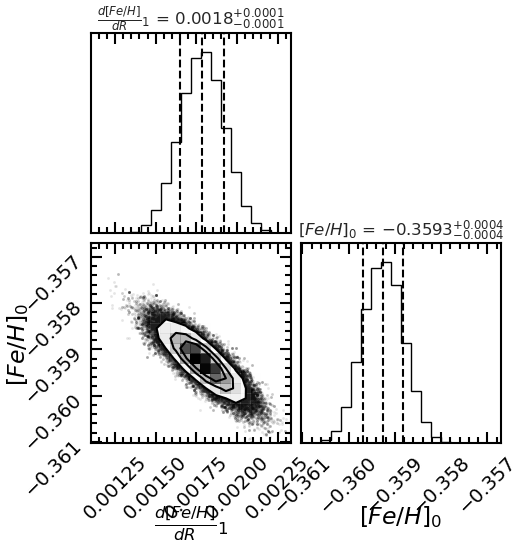

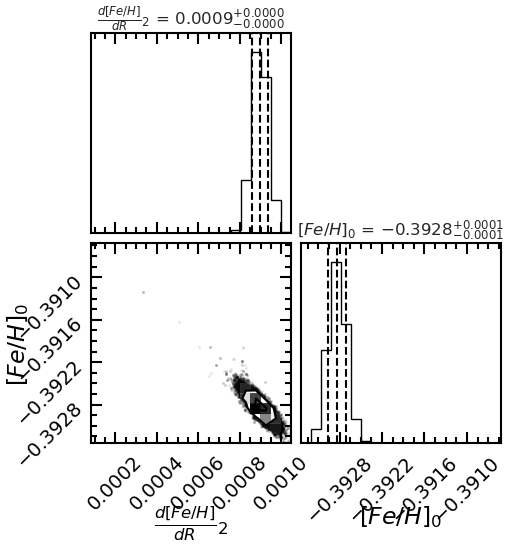

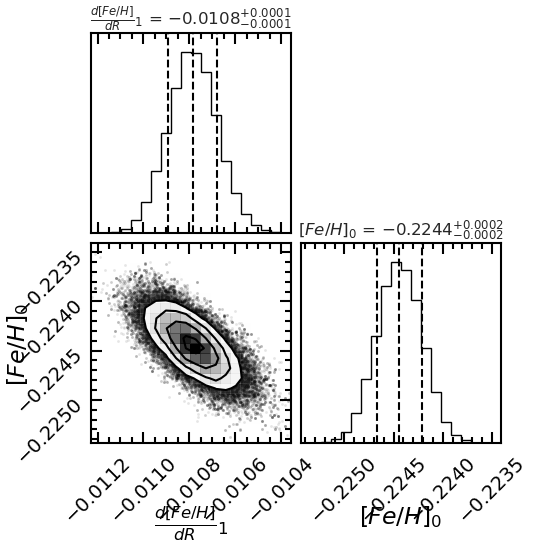

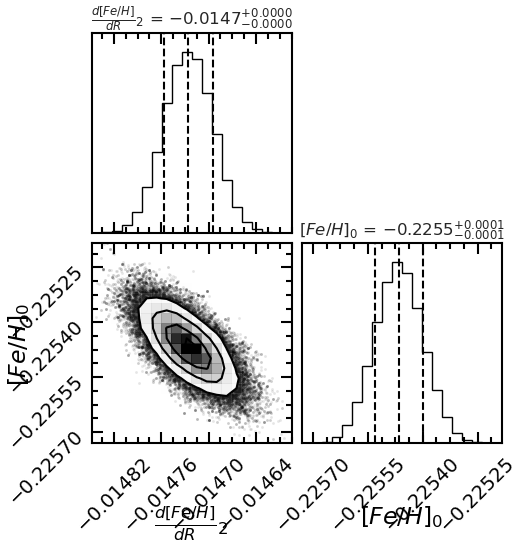

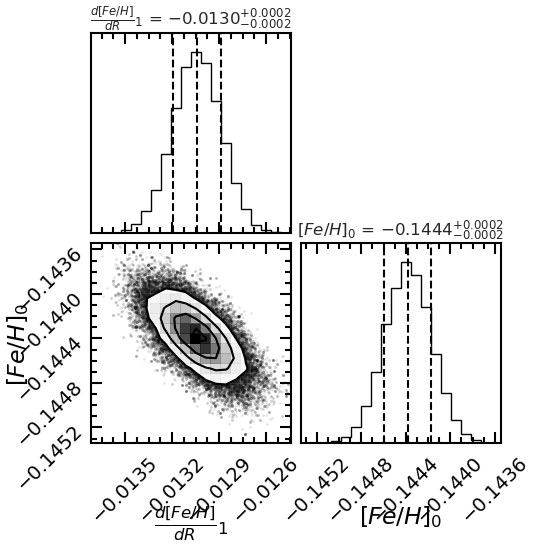

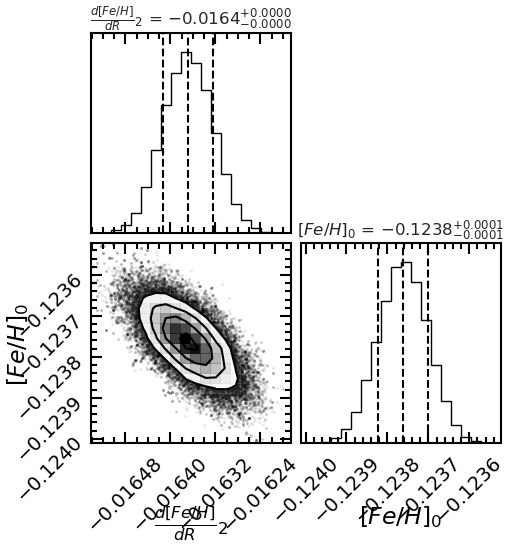

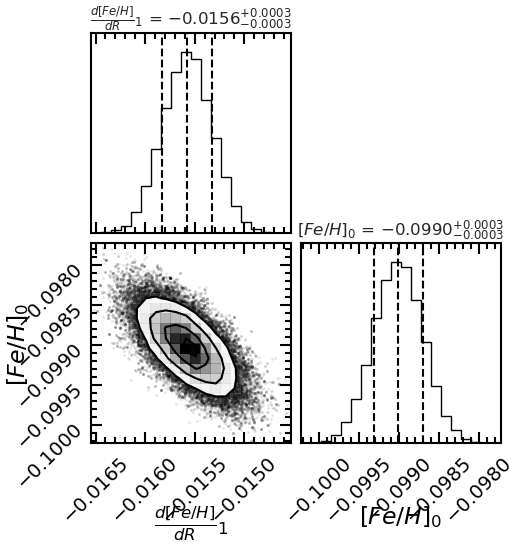

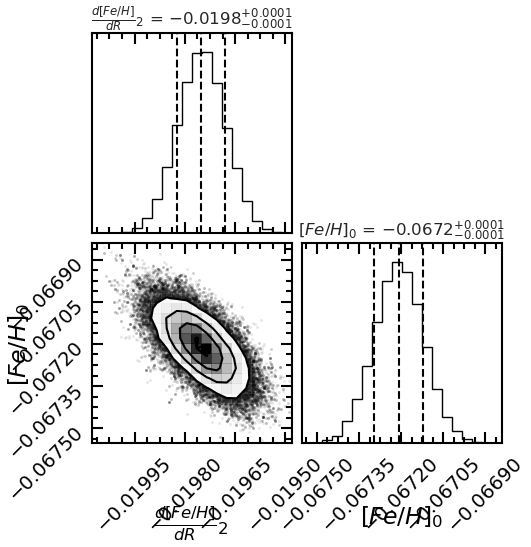

In [290]:
# y = feh sig = feh_err
def ln_posterior1(hyper,y,sigma,rgc):
    a,b = hyper
    if (a>1e4) or (b>1e5) or (a<-1e4):
        return -1e50
    theta = a*rgc + b   
    L = np.sum( -(y-theta)**2/(2*sigma**2) -0.5*np.log(2.*np.pi) -np.log(sigma) )
    return L

# 对每个zbin跑MCMC
zbin = [1.5,1.0,0.5,0.25,0.15]
for i in range(4):
    r1 = test[(test['cnn1_R'] / 1000 <= 20) & ((abs(test['cnn1_Z'] / 1000) < zbin[i]) & (abs(test['cnn1_Z'] / 1000) > zbin[i + 1]))]['cnn1_R'] / 1000
    r2 = test[(test['cnn2_R'] / 1000 <= 20) & ((abs(test['cnn2_Z'] / 1000) < zbin[i]) & (abs(test['cnn2_Z'] / 1000) > zbin[i + 1]))]['cnn2_R'] / 1000
    feh1 = test[(test['cnn1_R'] / 1000 <= 20) & ((abs(test['cnn1_Z'] / 1000) < zbin[i]) & (abs(test['cnn1_Z'] / 1000) > zbin[i + 1]))]['cnn1_feh']
    feh2 = test[(test['cnn2_R'] / 1000 <= 20) & ((abs(test['cnn2_Z'] / 1000) < zbin[i]) & (abs(test['cnn2_Z'] / 1000) > zbin[i + 1]))]['cnn2_feh']
    # 注意！重要！不然会报错！
    r1 = r1.reset_index(drop=True) 
    r2 = r2.reset_index(drop=True)
    feh1 = feh1.reset_index(drop=True)
    feh2 = feh2.reset_index(drop=True)
    # 检查 ln_posterior
    print(ln_posterior1(hyper=[-0.076,0.6],y=feh1[0],sigma=0.056,rgc=r1[0]))

    nwalker = 50
    ndim = 2
    p0 = np.zeros((nwalker,ndim))
    p0[:,0] = np.random.rand(nwalker)*-0.01
    p0[:,1] = np.random.rand(nwalker)*0.1
    # 为CNN1跑MCMC
    sampler1 = emcee.EnsembleSampler(nwalker, ndim, ln_posterior1,args=[feh1,0.056,r1])
    pos1,prob1,stat1 = sampler1.run_mcmc(p0,100)
    sampler1.reset()
    sampler1.run_mcmc(pos1,2000,progress=True)
    # 为CNN2跑MCMC
    sampler2 = emcee.EnsembleSampler(nwalker, ndim, ln_posterior1,args=[feh2,0.016,r2])
    pos2,prob2,stat2 = sampler2.run_mcmc(p0,100)
    sampler2.reset()
    sampler2.run_mcmc(pos2,2000,progress=True)
    # 画两者的corner图
    samples1 = sampler1.chain[:, :, :].reshape((-1, ndim))
    samples2 = sampler2.chain[:, :, :].reshape((-1, ndim))
    fig = corner.corner(samples1,
        labels=[r'$\frac{d[Fe/H]}{dR}_{1}$',r'$[Fe/H]_{0}$'],
            quantiles=[0.16, 0.5, 0.84],
            show_titles=True, 
            title_kwargs={"fontsize": 12},
            title_fmt = '.4f')
    fig = corner.corner(samples2,
        labels=[r'$\frac{d[Fe/H]}{dR}_{2}$',r'$[Fe/H]_{0}$'],
            quantiles=[0.16, 0.5, 0.84],
            show_titles=True, 
            title_kwargs={"fontsize": 12},
            title_fmt = '.4f')

/var/folders/v3/plfs35nd7xs9ph8dyb74gftw0000gn/T/ipykernel_22046/1627023047.py:5: DtypeWarning: Columns (12,13,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  bad_dp = pd.read_csv('/Volumes/Vega/data/application/bad_dis_plx/bad_dis_plx_outputparam.csv')


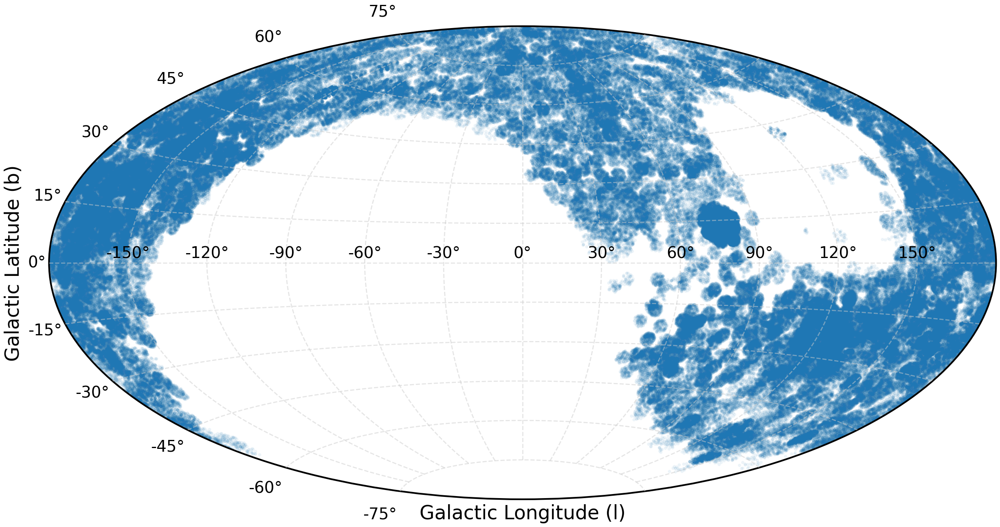

In [3]:
from astropy import units as u
from astropy.coordinates import SkyCoord
import numpy as np

bad_dp = pd.read_csv('/Volumes/Vega/data/application/bad_dis_plx/bad_dis_plx_outputparam.csv')
ra = bad_dp['ra_2'] * u.degree
dec = bad_dp['dec_2'] * u.degree

c = SkyCoord(ra=ra, dec=dec, unit='deg', frame='icrs')
galactic_coord = c.transform_to('galactic')
l = galactic_coord.l.wrap_at('180d').radian  # 将银道经度转换为弧度并处理跨越边界
b = galactic_coord.b.radian

fig = plt.figure(figsize=(15, 10),dpi=200)
ax = fig.add_subplot(111, projection="aitoff")
ax.set_axisbelow(False)

# 绘制散点图
ax.plot(l, b, 'o', markersize=2, alpha=0.05) 
# 显示网格线
ax.grid(True, linestyle='--') 

# 添加坐标轴标签
ax.set_xlabel('Galactic Longitude (l)')
ax.set_ylabel('Galactic Latitude (b)')

# 显示图形
plt.show()


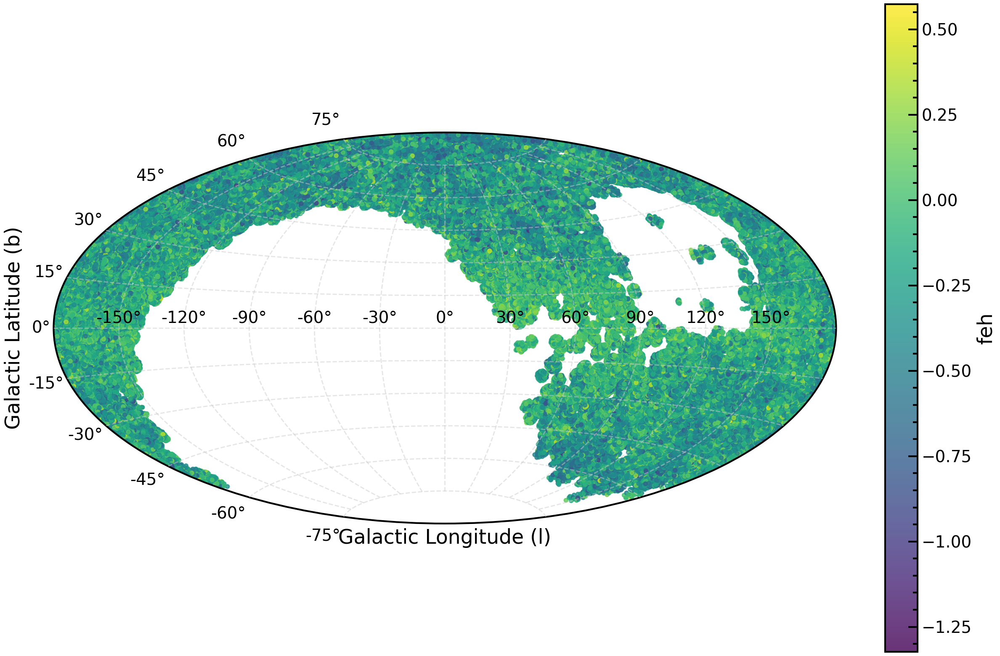

In [10]:
# 假设有 feh 数值的列表
feh = bad_dp['cnn1_feh']  # 用你的实际数据替换这里的省略号

fig = plt.figure(figsize=(15, 10), dpi=200)
ax = fig.add_subplot(111, projection="aitoff")
ax.set_axisbelow(False)

# 绘制散点图，并根据 feh 数值设置颜色和透明度
sc = ax.scatter(l, b, c=feh, cmap='viridis', s=10, alpha=0.8)

# 添加颜色标注
cbar = plt.colorbar(sc)
cbar.set_label('feh')

# 显示网格线
ax.grid(True, linestyle='--')

# 添加坐标轴标签
ax.set_xlabel('Galactic Longitude (l)')
ax.set_ylabel('Galactic Latitude (b)')

# 显示图形
plt.show()

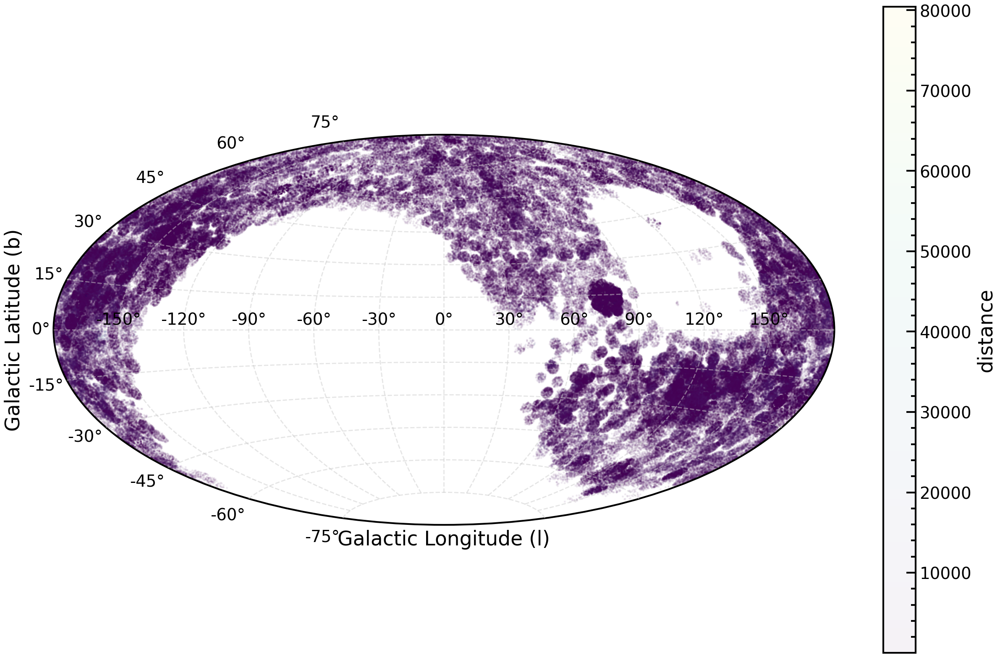

In [6]:
# 假设有 dis 数值的列表
dis = bad_dp['cnn1_direct_d']  # 用你的实际数据替换这里的省略号

fig = plt.figure(figsize=(15, 10), dpi=200)
ax = fig.add_subplot(111, projection="aitoff")
ax.set_axisbelow(False)

# 绘制散点图，并根据 feh 数值设置颜色和透明度
sc = ax.scatter(l, b, c=dis, cmap='viridis', s=1, alpha=0.05)

# 添加颜色标注
cbar = plt.colorbar(sc)
cbar.set_label('distance')

# 显示网格线
ax.grid(True, linestyle='--')

# 添加坐标轴标签
ax.set_xlabel('Galactic Longitude (l)')
ax.set_ylabel('Galactic Latitude (b)')

# 显示图形
plt.show()

Text(0, 0.5, '[Fe/H]')

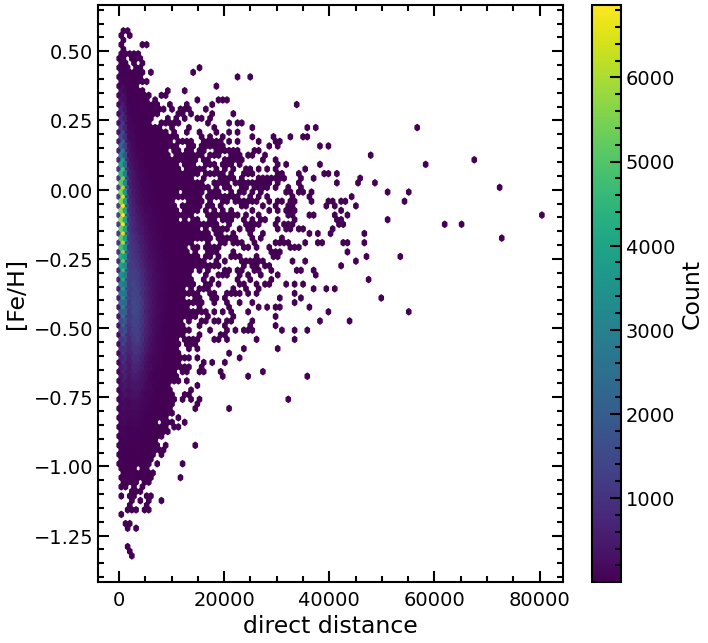

In [185]:
dis = test['cnn1_direct_d']
feh = test['cnn1_feh']

fig,ax = plt.subplots()
sc = ax.hexbin(dis,feh,gridsize=100,mincnt=1)
# 添加颜色标注
cbar = plt.colorbar(sc)
cbar.set_label('Count')

ax.set_xlabel('direct distance')
ax.set_ylabel('[Fe/H]')

527
3703


Text(0, 0.5, '[Fe/H] cnn1')

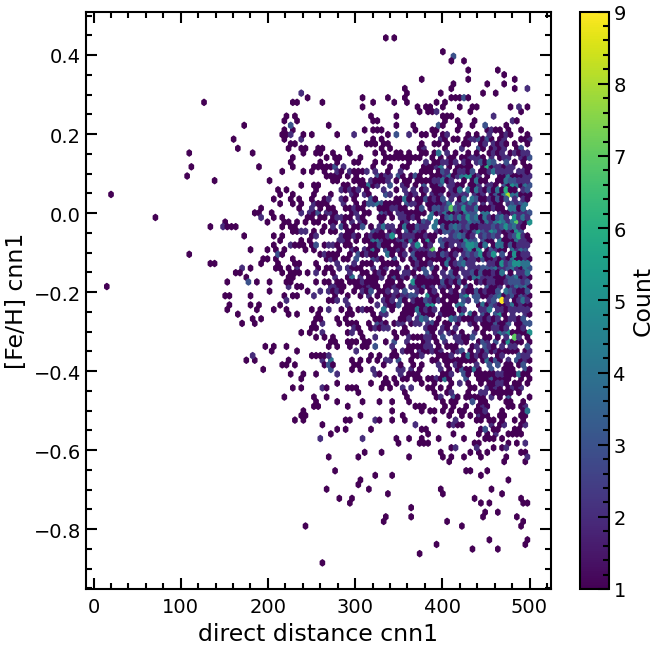

In [49]:
id = test['cnn1_direct_d']<500
dis = test.loc[id,'cnn1_direct_d']
feh = test.loc[id,'cnn1_feh']
print(len(dis[dis<300]))
print(len(dis))

fig,ax = plt.subplots()
sc = ax.hexbin(dis,feh,gridsize=100,mincnt=1)
# 添加颜色标注
cbar = plt.colorbar(sc)
cbar.set_label('Count')

ax.set_xlabel('direct distance cnn1')
ax.set_ylabel('[Fe/H] cnn1')

472
3349


Text(0, 0.5, '[Fe/H] cnn2')

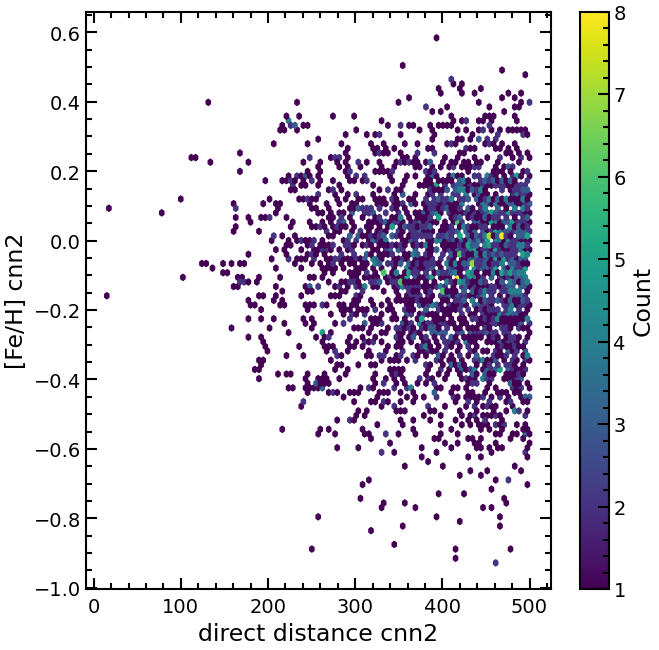

In [48]:
id = test['cnn2_direct_d']<500
dis = test.loc[id,'cnn2_direct_d']
feh = test.loc[id,'cnn2_feh']
print(len(dis[dis<300]))
print(len(dis))

fig,ax = plt.subplots()
sc = ax.hexbin(dis,feh,gridsize=100,mincnt=1)
# 添加颜色标注
cbar = plt.colorbar(sc)
cbar.set_label('Count')

ax.set_xlabel('direct distance cnn2')
ax.set_ylabel('[Fe/H] cnn2')